<a href="https://colab.research.google.com/github/snwnkang/CS109A_Final/blob/main/Milestone4_Template.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Operational Energy
Building operational energy is the required energy to run a building once it is occupied and functioning. In contrast to embodied energy, which refers to energy consumed in the production of materials, transportation and construction of the building, operational energy is primarily concerned with the energy consumption during a building's life cycle, and typically it constitutes the majority of any building's Life Cycle Energy (LCE) use.
<br>
<br>
$\Large \frac{(kWh) \: \text{Annual Energy Consumption}}{(m^2) \: \text{Total Floor area}}$
<br>
<br>
#### Energy consuming systems include:

- Space Heating
- Space Cooling
- Ventilation
- Lighting
- Plug Loads
- Water Heating

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [ ]:
df = pd.read_csv("https://raw.githubusercontent.com/snwnkang/CS109A_Final/main/data/Milestones1_3_data/230421_operational_novent_cleaned_32k.csv")

In [ ]:
df["program"].head(2)

0    6
1    6
Name: program, dtype: int64

**Verify that there are no missing values**

In this case, the data was produced by our groupmate Lucy, who had already done significant work in cleaning and maintaining the data. We confirm below that there are no *missing values* for any of the columns.

In [ ]:
#confirm there are no missing values
df_missingness = df.isna().sum()
df_missingness

seed                                 0
Equipment                            0
WallType                             0
Orientation                          0
Efficiency                           0
NaturalVentilation                   0
SensibleRate                         0
LatentRate                           0
ThermalPerformance                   0
ThermalMassFlip                      0
nonMassWallR [m^2-K/W]               0
MassWallR [m^2-K/W]                  0
RoofR [m^2-K/W]                      0
InteriorFloorR [m^2-K/W]             0
ExteriorFloorR [m^2-K/W]             0
WWRnorth                             0
WWRwest                              0
WWRsouth                             0
WWReast                              0
SHGC                                 0
WindowR [m^2-K/W]                    0
BuildingVolumn [m^3]                 0
TotalFloorArea [m^2]                 0
f2fHeight [m]                        0
numFloor                             0
TotalRoofArea [m^2]      

In [ ]:
selected_columns = [
    'program',
    'Equipment',
    'Orientation',
    'nonMassWallR [m^2-K/W]',
    'MassWallR [m^2-K/W]',
    'RoofR [m^2-K/W]',
    'InteriorFloorR [m^2-K/W]',
    'ExteriorFloorR [m^2-K/W]',
    'WWRnorth',
    'WWRwest',
    'WWRsouth',
    'WWReast',
    'SHGC',
    'WindowR [m^2-K/W]',
    'numFloor',
    'AspectRatio',
    'WallType',
    'BuildingVolumn [m^3]',
    'TotalFacadeArea [m^2]',
    'CoolingElecPerArea [KWh/yr/m^2]',
    'HeatingElecPerArea [KWh/yr/m^2]',
    'HeatingGasPerArea [KWh/yr/m^2]',
    'FanElecPerArea [KWh/yr/m^2]',
    'PumpElecPerArea [KWh/yr/m^2]',
    'LightElecPerArea [KWh/yr/m^2]',
    'ApplianceElecPerArea [KWh/yr/m^2]',
    'ApplianceGasPerArea [KWh/yr/m^2]',
    'HotWaterPerArea [KWh/yr/m^2]'
]

In [ ]:
df_sel = df.loc[:, selected_columns]
df_sel.head(5)

,program,Equipment,Orientation,nonMassWallR [m^2-K/W],MassWallR [m^2-K/W],RoofR [m^2-K/W],InteriorFloorR [m^2-K/W],ExteriorFloorR [m^2-K/W],WWRnorth,WWRwest,...,TotalFacadeArea [m^2],CoolingElecPerArea [KWh/yr/m^2],HeatingElecPerArea [KWh/yr/m^2],HeatingGasPerArea [KWh/yr/m^2],FanElecPerArea [KWh/yr/m^2],PumpElecPerArea [KWh/yr/m^2],LightElecPerArea [KWh/yr/m^2],ApplianceElecPerArea [KWh/yr/m^2],ApplianceGasPerArea [KWh/yr/m^2],HotWaterPerArea [KWh/yr/m^2]
0,6,1,348,2.88,0.00,8.38,0.7,5.38,0.23,0.11,...,838.42,27.738170,0.655711,0.000000,37.381036,0.000000,48.761679,23.747175,0.000000,3.331522
1,6,5,96,3.58,0.00,10.49,0.7,6.61,0.32,0.24,...,1752.68,29.263610,0.000000,4.925151,6.158374,11.487335,48.761679,23.747175,0.000000,3.331522
2,3,4,182,2.21,0.00,5.52,0.7,3.43,0.38,0.37,...,4870.35,51.284081,0.000689,0.000000,10.425784,13.536407,23.584477,56.731922,73.547939,26.657480
3,5,0,359,0.00,2.03,5.52,0.7,3.08,0.42,0.38,...,6688.49,23.836787,0.000000,1.476935,30.337577,0.000000,11.131444,32.118759,0.000000,27.453894
4,4,5,317,2.02,0.00,4.40,0.7,4.68,0.90,0.90,...,9515.83,34.512464,0.000000,13.066668,7.127550,10.991456,25.570450,30.902514,0.000000,2.562507


In [ ]:
df_sel.describe()

,program,Equipment,Orientation,nonMassWallR [m^2-K/W],MassWallR [m^2-K/W],RoofR [m^2-K/W],InteriorFloorR [m^2-K/W],ExteriorFloorR [m^2-K/W],WWRnorth,WWRwest,...,TotalFacadeArea [m^2],CoolingElecPerArea [KWh/yr/m^2],HeatingElecPerArea [KWh/yr/m^2],HeatingGasPerArea [KWh/yr/m^2],FanElecPerArea [KWh/yr/m^2],PumpElecPerArea [KWh/yr/m^2],LightElecPerArea [KWh/yr/m^2],ApplianceElecPerArea [KWh/yr/m^2],ApplianceGasPerArea [KWh/yr/m^2],HotWaterPerArea [KWh/yr/m^2]
count,32500.000000,32500.000000,32500.000000,32500.000000,32500.000000,32500.000000,3.250000e+04,32500.000000,32500.000000,32500.000000,...,32500.000000,32500.000000,32500.000000,32500.000000,32500.000000,32500.000000,32500.000000,32500.000000,32500.000000,32500.000000
mean,4.489169,2.506369,179.894585,2.384207,0.321344,5.930260,7.000000e-01,4.133882,0.516276,0.516068,...,2439.473324,41.590416,0.878257,3.788307,19.568955,6.833864,34.491958,56.094904,37.832367,19.993414
std,2.862389,1.706247,104.237783,1.472428,0.814431,1.614038,1.110240e-16,1.772313,0.264802,0.264985,...,2128.915040,30.595159,2.210626,9.634782,24.345446,7.899791,12.843465,60.938397,75.988763,36.083727
min,0.000000,0.000000,0.000000,0.000000,0.000000,3.760000,7.000000e-01,0.610000,0.100000,0.100000,...,127.920000,0.000000,0.000000,0.000000,0.000000,0.000000,11.131444,7.887766,0.000000,0.000000
25%,2.000000,1.000000,90.000000,1.500000,0.000000,4.640000,7.000000e-01,3.080000,0.290000,0.290000,...,844.535000,23.235079,0.000000,0.000000,4.827764,0.000000,24.195756,23.747175,0.000000,0.965401
50%,4.000000,3.000000,180.000000,2.210000,0.000000,5.520000,7.000000e-01,4.680000,0.480000,0.480000,...,1615.240000,33.703803,0.000000,0.000000,8.058063,6.027070,33.661268,32.118759,0.000000,6.666019
75%,7.000000,4.000000,270.000000,3.580000,0.000000,6.400000,7.000000e-01,5.560000,0.820000,0.820000,...,3558.667500,51.936903,0.536345,2.114257,29.932978,10.104479,48.725984,56.731922,34.790597,26.657480
max,9.000000,5.000000,360.000000,5.520000,3.790000,10.490000,7.000000e-01,6.610000,0.900000,0.900000,...,12857.950000,237.422687,29.362471,117.112497,216.142808,52.081393,52.057494,226.922176,255.286289,124.023484


**Data Imbalance**

Our program variable is a categorical variable, and ranges from 0 - 9, 10 numbers that correspond to the following:

*(The following are ordered, corresponding to 0 - 9)*
- Courthouse
- Full Service Restaurant
- Hospital
- Large Hotel
- Medium Office
- Midrise Apartment
- Retail
- Secondary School
- Supermarket
- Warehouse

Below, we verify that there is a good balance between samples for each program. We do the same for **WallType** which will be an important aspect for prediction later on.

In [ ]:
#Data imbalance (confirm that for each program and wall type, there are enough samples)
program_counts = df['program'].value_counts().sort_index()
print(program_counts)

0    3227
1    3257
2    3272
3    3261
4    3236
5    3346
6    3264
7    3261
8    3155
9    3221
Name: program, dtype: int64


In [ ]:
program_counts = df['WallType'].value_counts().sort_index()
print(program_counts)

0    10828
1     7231
2     7222
3     7219
Name: WallType, dtype: int64


In [ ]:
df_sel['VolumeToFacadeRatio'] = df['BuildingVolumn [m^3]'] / df['TotalFacadeArea [m^2]']

In [ ]:
df_sel.head(5)

,program,Equipment,Orientation,nonMassWallR [m^2-K/W],MassWallR [m^2-K/W],RoofR [m^2-K/W],InteriorFloorR [m^2-K/W],ExteriorFloorR [m^2-K/W],WWRnorth,WWRwest,...,CoolingElecPerArea [KWh/yr/m^2],HeatingElecPerArea [KWh/yr/m^2],HeatingGasPerArea [KWh/yr/m^2],FanElecPerArea [KWh/yr/m^2],PumpElecPerArea [KWh/yr/m^2],LightElecPerArea [KWh/yr/m^2],ApplianceElecPerArea [KWh/yr/m^2],ApplianceGasPerArea [KWh/yr/m^2],HotWaterPerArea [KWh/yr/m^2],VolumeToFacadeRatio
0,6,1,348,2.88,0.00,8.38,0.7,5.38,0.23,0.11,...,27.738170,0.655711,0.000000,37.381036,0.000000,48.761679,23.747175,0.000000,3.331522,11.441270
1,6,5,96,3.58,0.00,10.49,0.7,6.61,0.32,0.24,...,29.263610,0.000000,4.925151,6.158374,11.487335,48.761679,23.747175,0.000000,3.331522,11.387247
2,3,4,182,2.21,0.00,5.52,0.7,3.43,0.38,0.37,...,51.284081,0.000689,0.000000,10.425784,13.536407,23.584477,56.731922,73.547939,26.657480,8.153950
3,5,0,359,0.00,2.03,5.52,0.7,3.08,0.42,0.38,...,23.836787,0.000000,1.476935,30.337577,0.000000,11.131444,32.118759,0.000000,27.453894,7.132345
4,4,5,317,2.02,0.00,4.40,0.7,4.68,0.90,0.90,...,34.512464,0.000000,13.066668,7.127550,10.991456,25.570450,30.902514,0.000000,2.562507,9.796224


In [ ]:
#filter out the columns with [kWh/yr/m^2]
kwh_col = [col for col in df_sel.columns if '[KWh/yr/m^2]' in col]
kwh_col

['CoolingElecPerArea [KWh/yr/m^2]',
 'HeatingElecPerArea [KWh/yr/m^2]',
 'HeatingGasPerArea [KWh/yr/m^2]',
 'FanElecPerArea [KWh/yr/m^2]',
 'PumpElecPerArea [KWh/yr/m^2]',
 'LightElecPerArea [KWh/yr/m^2]',
 'ApplianceElecPerArea [KWh/yr/m^2]',
 'ApplianceGasPerArea [KWh/yr/m^2]',
 'HotWaterPerArea [KWh/yr/m^2]']

In [ ]:
df_sel['OE'] = df_sel[kwh_col].sum(axis=1)
df_sel.head(5)

,program,Equipment,Orientation,nonMassWallR [m^2-K/W],MassWallR [m^2-K/W],RoofR [m^2-K/W],InteriorFloorR [m^2-K/W],ExteriorFloorR [m^2-K/W],WWRnorth,WWRwest,...,HeatingElecPerArea [KWh/yr/m^2],HeatingGasPerArea [KWh/yr/m^2],FanElecPerArea [KWh/yr/m^2],PumpElecPerArea [KWh/yr/m^2],LightElecPerArea [KWh/yr/m^2],ApplianceElecPerArea [KWh/yr/m^2],ApplianceGasPerArea [KWh/yr/m^2],HotWaterPerArea [KWh/yr/m^2],VolumeToFacadeRatio,OE
0,6,1,348,2.88,0.00,8.38,0.7,5.38,0.23,0.11,...,0.655711,0.000000,37.381036,0.000000,48.761679,23.747175,0.000000,3.331522,11.441270,141.615293
1,6,5,96,3.58,0.00,10.49,0.7,6.61,0.32,0.24,...,0.000000,4.925151,6.158374,11.487335,48.761679,23.747175,0.000000,3.331522,11.387247,127.674846
2,3,4,182,2.21,0.00,5.52,0.7,3.43,0.38,0.37,...,0.000689,0.000000,10.425784,13.536407,23.584477,56.731922,73.547939,26.657480,8.153950,255.768779
3,5,0,359,0.00,2.03,5.52,0.7,3.08,0.42,0.38,...,0.000000,1.476935,30.337577,0.000000,11.131444,32.118759,0.000000,27.453894,7.132345,126.355396
4,4,5,317,2.02,0.00,4.40,0.7,4.68,0.90,0.90,...,0.000000,13.066668,7.127550,10.991456,25.570450,30.902514,0.000000,2.562507,9.796224,124.733609


In [ ]:
#drop the columns that are no longer being used
drop_cols = [
    'BuildingVolumn [m^3]',
    'TotalFacadeArea [m^2]',
    ]

drop_cols.extend(kwh_col)

df_sel = df_sel.drop(columns=drop_cols)

In [ ]:
df_sel

,program,Equipment,Orientation,nonMassWallR [m^2-K/W],MassWallR [m^2-K/W],RoofR [m^2-K/W],InteriorFloorR [m^2-K/W],ExteriorFloorR [m^2-K/W],WWRnorth,WWRwest,WWRsouth,WWReast,SHGC,WindowR [m^2-K/W],numFloor,AspectRatio,WallType,VolumeToFacadeRatio,OE
0,6,1,348,2.88,0.00,8.38,0.7,5.38,0.23,0.11,0.58,0.15,0.36,0.32,1,2.06,3,11.441270,141.615293
1,6,5,96,3.58,0.00,10.49,0.7,6.61,0.32,0.24,0.28,0.48,0.40,0.43,2,1.00,3,11.387247,127.674846
2,3,4,182,2.21,0.00,5.52,0.7,3.43,0.38,0.37,0.56,0.13,0.38,0.34,12,2.30,0,8.153950,255.768779
3,5,0,359,0.00,2.03,5.52,0.7,3.08,0.42,0.38,0.37,0.49,0.38,0.32,12,1.11,0,7.132345,126.355396
4,4,5,317,2.02,0.00,4.40,0.7,4.68,0.90,0.90,0.90,0.90,0.25,0.22,13,4.51,1,9.796224,124.733609
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32495,2,0,275,3.58,0.00,8.38,0.7,5.38,0.33,0.31,0.20,0.35,0.38,0.32,3,1.95,3,9.128145,262.489727
32496,1,2,20,4.13,0.00,6.16,0.7,5.56,0.85,0.85,0.85,0.85,0.40,0.43,1,4.67,1,5.381771,831.718861
32497,6,1,330,4.66,0.00,6.87,0.7,5.56,0.41,0.12,0.56,0.19,0.40,0.50,1,1.43,1,7.705619,167.629299
32498,0,5,276,3.60,0.00,5.81,0.7,5.56,0.87,0.87,0.87,0.87,0.38,0.34,2,3.35,1,7.350630,131.890766


In [ ]:
df_sel_eqp = df_sel['Equipment'].unique()
df_sel_eqp

array([1, 5, 4, 0, 2, 3])

In [ ]:
df_sel_wt = df_sel['WallType'].unique()
df_sel_wt

array([3, 0, 1, 2])

In [ ]:
df_sel_prg = df_sel['program'].unique()
df_sel_prg

array([6, 3, 5, 4, 7, 2, 1, 0, 8, 9])

**One Hot Encoding**

For the categorical variables program and wall type, we will one-hot-encode, making sure to drop the first column of each (given the condition that if all others have 0, then we safely assume that it will be program 0 or wall type 0)

In [ ]:
#separate the categorical variables (PROGRAM, WALL TYPE, EQUIPMENT)
categorical_features = ['Equipment', 'program', 'WallType']
continuous_features = [col for col in df_sel.columns if col not in (categorical_features + ['OE'])]

In [ ]:
#one-hot-encoding for categorical variables (program & wall type)
df_sel = pd.get_dummies(df_sel, columns=categorical_features, drop_first=True)

In [ ]:
df_sel

,Orientation,nonMassWallR [m^2-K/W],MassWallR [m^2-K/W],RoofR [m^2-K/W],InteriorFloorR [m^2-K/W],ExteriorFloorR [m^2-K/W],WWRnorth,WWRwest,WWRsouth,WWReast,...,program_3,program_4,program_5,program_6,program_7,program_8,program_9,WallType_1,WallType_2,WallType_3
0,348,2.88,0.00,8.38,0.7,5.38,0.23,0.11,0.58,0.15,...,0,0,0,1,0,0,0,0,0,1
1,96,3.58,0.00,10.49,0.7,6.61,0.32,0.24,0.28,0.48,...,0,0,0,1,0,0,0,0,0,1
2,182,2.21,0.00,5.52,0.7,3.43,0.38,0.37,0.56,0.13,...,1,0,0,0,0,0,0,0,0,0
3,359,0.00,2.03,5.52,0.7,3.08,0.42,0.38,0.37,0.49,...,0,0,1,0,0,0,0,0,0,0
4,317,2.02,0.00,4.40,0.7,4.68,0.90,0.90,0.90,0.90,...,0,1,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32495,275,3.58,0.00,8.38,0.7,5.38,0.33,0.31,0.20,0.35,...,0,0,0,0,0,0,0,0,0,1
32496,20,4.13,0.00,6.16,0.7,5.56,0.85,0.85,0.85,0.85,...,0,0,0,0,0,0,0,1,0,0
32497,330,4.66,0.00,6.87,0.7,5.56,0.41,0.12,0.56,0.19,...,0,0,0,1,0,0,0,1,0,0
32498,276,3.60,0.00,5.81,0.7,5.56,0.87,0.87,0.87,0.87,...,0,0,0,0,0,0,0,1,0,0


In [ ]:
X = df_sel.drop(columns=['OE'])
y = df_sel['OE']

In [ ]:
y.to_csv('response.csv')
X.to_csv('predictors.csv')

In [ ]:
X_missingness = X.isna().sum()
X_missingness

Orientation                 0
nonMassWallR [m^2-K/W]      0
MassWallR [m^2-K/W]         0
RoofR [m^2-K/W]             0
InteriorFloorR [m^2-K/W]    0
ExteriorFloorR [m^2-K/W]    0
WWRnorth                    0
WWRwest                     0
WWRsouth                    0
WWReast                     0
SHGC                        0
WindowR [m^2-K/W]           0
numFloor                    0
AspectRatio                 0
VolumeToFacadeRatio         0
Equipment_1                 0
Equipment_2                 0
Equipment_3                 0
Equipment_4                 0
Equipment_5                 0
program_1                   0
program_2                   0
program_3                   0
program_4                   0
program_5                   0
program_6                   0
program_7                   0
program_8                   0
program_9                   0
WallType_1                  0
WallType_2                  0
WallType_3                  0
dtype: int64

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [ ]:
#Standardization of values (except categorical 'program' and 'WallType')
StdScaler = StandardScaler()
X_train_cf_std = StdScaler.fit_transform(X_train[continuous_features])
X_test_cf_std = StdScaler.transform(X_test[continuous_features])

In [ ]:
X_train_cf_std_df = pd.DataFrame(X_train_cf_std, index=X_train.index, columns=continuous_features)
X_test_cf_std_df = pd.DataFrame(X_test_cf_std, index=X_test.index, columns=continuous_features)

X_train_std = X_train.copy()
X_test_std = X_test.copy()
X_train_dropped = X_train_std.drop(columns=continuous_features)
X_test_dropped = X_test_std.drop(columns=continuous_features)

X_train_std = pd.concat([X_train_dropped, X_train_cf_std_df], axis=1)
X_test_std = pd.concat([X_test_dropped, X_test_cf_std_df], axis=1)

In [ ]:
X_train_std

,Equipment_1,Equipment_2,Equipment_3,Equipment_4,Equipment_5,program_1,program_2,program_3,program_4,program_5,...,ExteriorFloorR [m^2-K/W],WWRnorth,WWRwest,WWRsouth,WWReast,SHGC,WindowR [m^2-K/W],numFloor,AspectRatio,VolumeToFacadeRatio
8147,0,0,0,0,1,0,0,0,0,0,...,0.096674,-0.891185,-1.006128,-0.177140,-0.930799,0.989317,1.102001,-0.807970,0.073278,-0.603365
22206,0,0,0,0,1,0,0,0,0,0,...,-1.987742,-0.891185,-0.326741,-0.290419,-0.779911,-1.462160,-1.406185,-0.807970,0.923999,-0.979970
18229,0,0,0,0,0,0,0,0,0,0,...,0.800868,1.333876,1.333983,1.333238,1.332524,0.989317,1.804293,-0.807970,-1.512812,1.455198
4387,0,0,0,1,0,0,0,0,1,0,...,0.800868,0.277915,-0.175766,-1.272164,0.049974,0.989317,1.804293,-0.545075,-0.640463,0.023375
12862,0,0,0,0,1,0,0,0,0,1,...,0.305115,1.220737,1.220752,1.219960,1.219358,-1.173751,-1.004876,2.872563,0.469800,-0.757718
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29802,0,0,0,0,0,0,0,0,0,0,...,0.699464,1.069886,1.069777,1.068922,1.068470,-1.173751,-1.004876,-0.545075,0.448172,-0.033197
5390,0,0,0,0,0,0,0,0,1,0,...,1.392392,-0.061501,-0.704178,-1.460962,0.238584,0.989317,1.102001,2.083877,-0.993728,-0.426102
860,0,0,0,0,0,0,0,0,0,0,...,-1.976475,1.220737,1.220752,1.219960,1.219358,-1.462160,-1.406185,-0.282180,0.217468,0.015089
15795,1,0,0,0,0,0,0,0,0,0,...,1.392392,-0.400917,-0.364484,-0.516975,0.012252,0.989317,1.804293,-0.282180,-0.597206,1.428997


In [ ]:
X_test_std

,Equipment_1,Equipment_2,Equipment_3,Equipment_4,Equipment_5,program_1,program_2,program_3,program_4,program_5,...,ExteriorFloorR [m^2-K/W],WWRnorth,WWRwest,WWRsouth,WWReast,SHGC,WindowR [m^2-K/W],numFloor,AspectRatio,VolumeToFacadeRatio
23022,0,0,0,0,1,1,0,0,0,0,...,0.800868,1.371589,1.371727,1.370997,1.370246,0.989317,1.102001,-0.282180,0.195839,-1.289886
22577,0,0,0,0,0,0,0,0,0,0,...,0.293848,-1.042036,-1.270334,-0.705773,-1.194854,0.989317,1.804293,-0.545075,-1.419089,-0.514906
12639,0,0,0,0,0,0,0,1,0,0,...,-1.390585,-0.287778,-1.496796,-0.441456,-0.817633,-1.173751,-1.004876,2.609667,-1.678631,0.078627
30245,0,0,0,0,0,0,0,1,0,0,...,0.305115,-0.514056,-0.628690,0.238214,-0.930799,-1.173751,-0.703893,1.295191,-1.303737,-0.231837
4413,0,0,0,0,0,0,0,0,0,0,...,0.305115,1.107599,1.107521,1.106681,1.106192,-1.173751,-1.004876,-0.019284,1.630530,1.208321
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21979,0,0,0,1,0,0,0,0,0,0,...,0.305115,0.277915,0.277159,-0.139381,-0.855355,-1.173751,-0.703893,-0.807970,1.666578,2.454929
26877,0,0,0,1,0,0,0,0,0,0,...,-1.390585,-0.551769,-0.855153,-1.536481,-1.006243,-1.173751,-1.004876,-0.545075,-1.520022,1.445052
15598,0,0,1,0,0,0,0,0,1,0,...,0.305115,0.051638,-0.704178,-1.536481,-1.043965,0.700908,-0.001601,0.506506,-0.885586,-0.249576
17223,0,1,0,0,0,0,0,1,0,0,...,-1.987742,-0.476343,-1.270334,-1.007848,0.012252,-1.462160,-1.406185,0.506506,0.152582,0.142346


<ipython-input-30-33cb40d80660>:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(continuous_features, rotation=45)


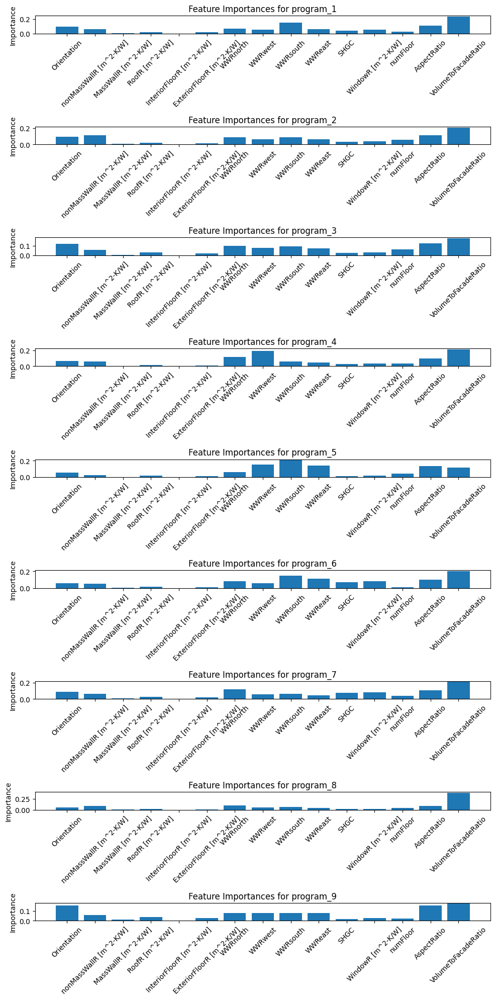

In [ ]:
from sklearn.ensemble import RandomForestRegressor

program_columns = [col for col in df_sel.columns if col.startswith('program_')]

program_feature_importances = {}

continuous_features = [feature for feature in continuous_features if feature not in program_columns]

for program in program_columns:
    program_data = df_sel[df_sel[program] == 1]

    X_program = program_data[continuous_features]
    y_program = program_data['OE']

    X_program_std = StdScaler.fit_transform(X_program)

    model = RandomForestRegressor(random_state=42)
    model.fit(X_program_std, y_program)

    importances = model.feature_importances_
    program_feature_importances[program] = importances

#See Feature importance...plot
fig, axes = plt.subplots(nrows=len(program_feature_importances), ncols=1, figsize=(10, 20))

for i, program in enumerate(program_columns):
    axes[i].bar(continuous_features, program_feature_importances[program])
    axes[i].set_title(f'Feature Importances for {program}')
    axes[i].set_ylabel('Importance')
    axes[i].set_xticklabels(continuous_features, rotation=45)

plt.tight_layout()
plt.show()

<br>
<h2>Exploratory Data Analysis</h2>
<p>The analysis was done by multiple members of the group individually and compiled into a single notebook. The repetition of data analysis may be seen in both Part 1 and 2, however, these procedures were necessary to cross-check and ensure correctness and better comparisons and discussions for the steps moving forward
<br>
<br>
<hr>
<br>
<h1>Data Analysis PART 1</h1>
<br>
<hr>

In [ ]:
#Making a new data frame that includes all data just for data exploratory and visualization purposes:
df = pd.read_csv("https://raw.githubusercontent.com/snwnkang/CS109A_Final/main/data/Milestones1_3_data/230421_operational_novent_cleaned_32k.csv")
df_sel_du = df.loc[:, selected_columns]
df_sel_du['VolumeToFacadeRatio'] = df['BuildingVolumn [m^3]'] / df['TotalFacadeArea [m^2]']
df_sel_du['OE'] = df_sel_du[kwh_col].sum(axis=1)
df_sel_du = df_sel_du.drop(columns=drop_cols)
df_sel_du.head(2)

,program,Equipment,Orientation,nonMassWallR [m^2-K/W],MassWallR [m^2-K/W],RoofR [m^2-K/W],InteriorFloorR [m^2-K/W],ExteriorFloorR [m^2-K/W],WWRnorth,WWRwest,WWRsouth,WWReast,SHGC,WindowR [m^2-K/W],numFloor,AspectRatio,WallType,VolumeToFacadeRatio,OE
0,6,1,348,2.88,0.0,8.38,0.7,5.38,0.23,0.11,0.58,0.15,0.36,0.32,1,2.06,3,11.441270,141.615293
1,6,5,96,3.58,0.0,10.49,0.7,6.61,0.32,0.24,0.28,0.48,0.40,0.43,2,1.00,3,11.387247,127.674846


In [ ]:
#Quantitive variables
cont_cols = ["Orientation", "nonMassWallR [m^2-K/W]", "MassWallR [m^2-K/W]", "RoofR [m^2-K/W]",  "ExteriorFloorR [m^2-K/W]", "WWRnorth", "WWRwest", "WWRsouth", "WWReast", "SHGC", "WindowR [m^2-K/W]", "numFloor", "AspectRatio", "VolumeToFacadeRatio"]

In [ ]:
#Categorical variables
cat_cols = ["program", "WallType", "Equipment"]

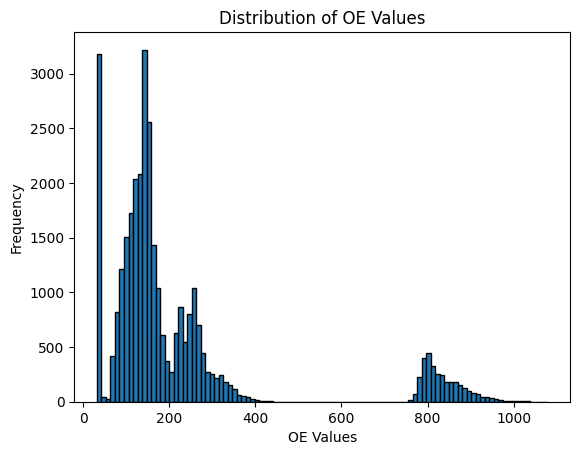

In [ ]:
#Distribution of OE values
plt.hist(df_sel_du['OE'], bins=100, edgecolor='black')  # You can adjust the number of bins as needed
plt.xlabel('OE Values')
plt.ylabel('Frequency')
plt.title('Distribution of OE Values')
plt.show()

In [ ]:
#Bringing back program names to use in visualizations
program_names = {
    0: "Courthouse",
    1: "Full Service Restaurant",
    2: "Hospital",
    3: "Large Hotel",
    4: "Medium Office",
    5: "Midrise Apartment",
    6: "Retail",
    7: "Secondary School",
    8: "Supermarket",
    9: "Warehouse",
}

In [ ]:
#Bringing back wall type names to use in visualizations
wall_names = {
    0: "Mass",
    1: "Steel framed",
    2: "Wood framed",
    3: "Metal"
}

In [ ]:
#Bringing back equipment type names to use in visualizations:
equip_names = {
    0: "Packaged Single Zone\n - gas boiler",
    1: "Packaged Single Zone\n - heat pump",
    2: "Variable Air Volume\n air-cooled chiller\n - gas boiler",
    3: "Variable Air Volume\n air-cooled chiller\n - heat pump",
    4: "Variable Air Volume\n chiller with central\n - gas boiler",
    5: "Variable Air Volume\n chiller with central\n - heat pump"
}

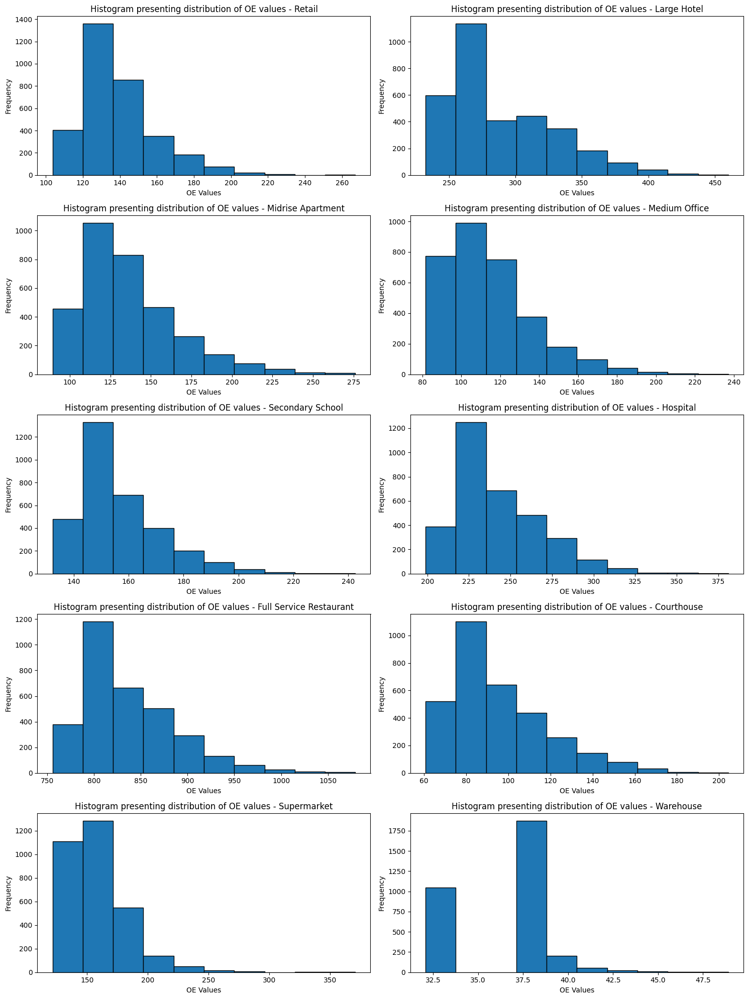

In [ ]:
#Distribution of OE values per program type
program_values = df_sel_du["program"].unique()
fig, axes = plt.subplots(5, 2, figsize=(15, 20), sharex=False, sharey=False)
axes = axes.flatten()

for i, program_value in enumerate(program_values):
    program_data = df_sel_du[df_sel_du["program"] == program_value]

    axes[i].hist(program_data['OE'], bins=10, edgecolor='black', label=f' {program_names[program_value]}')
    axes[i].set_title(f'Histogram presenting distribution of OE values - {program_names[program_value]}')
    axes[i].set_xlabel('OE Values')
    axes[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

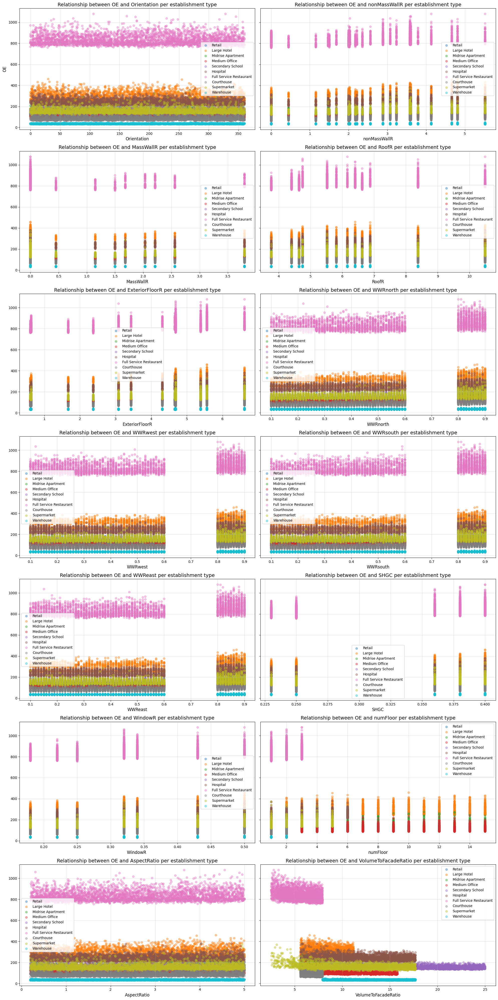

In [ ]:
#Relationship between OE and each variable per establishment type
fig, axes = plt.subplots(7, 2, sharey=True, figsize=(20, 40))
titles = ["Orientation", "nonMassWallR", "MassWallR", "RoofR" , "ExteriorFloorR", "WWRnorth", "WWRwest", "WWRsouth", "WWReast", "SHGC", "WindowR", "numFloor", "AspectRatio", "VolumeToFacadeRatio"]
xlabels = ["Orientation", "nonMassWallR", "MassWallR", "RoofR", "ExteriorFloorR", "WWRnorth", "WWRwest", "WWRsouth", "WWReast", "SHGC", "WindowR ", "numFloor", "AspectRatio", "VolumeToFacadeRatio"]
cont_cols = ["Orientation", "nonMassWallR [m^2-K/W]", "MassWallR [m^2-K/W]", "RoofR [m^2-K/W]",  "ExteriorFloorR [m^2-K/W]", "WWRnorth", "WWRwest", "WWRsouth", "WWReast", "SHGC", "WindowR [m^2-K/W]", "numFloor", "AspectRatio", "VolumeToFacadeRatio"]
fontsize = 14

# Create a list of unique program values for coloring and legend
program_values = df_sel_du["program"].unique()

for i, (ax, col, title, xlabel) in enumerate(
        zip(axes.flatten(), cont_cols, titles, xlabels)
):
    # Plot each program separately
    for program_value in program_values:
        # Select data for the current program
        program_data = df_sel_du[df_sel_du["program"] == program_value]

        # Scatter plot with color and label
        ax.scatter(program_data[col], program_data["OE"], alpha=0.4, label=program_names[program_value])

    ax.set_title(f"Relationship between OE and {title} per establishment type", fontsize=fontsize)
    ax.set_xlabel(xlabel, fontsize=fontsize - 2)
    ax.set_ylabel("OE" if i == 0 else None, fontsize=fontsize - 2)
    ax.grid(":", alpha=0.4)
    ax.legend()  # Add legend for each subplot

plt.tight_layout()
plt.show()

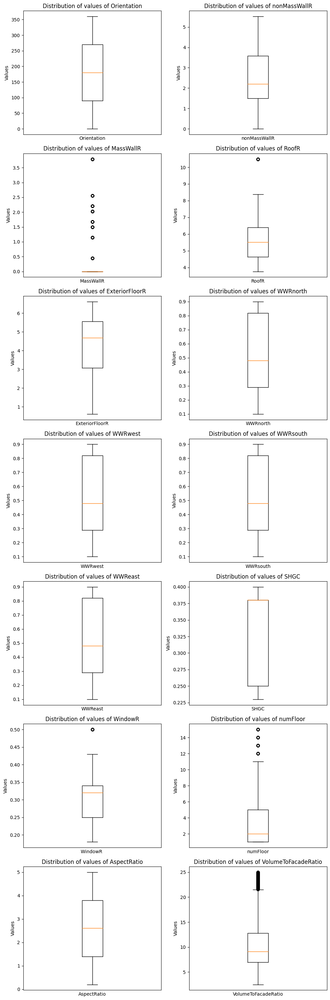

In [ ]:
# Box plots of each variables' values to identify outliers
plt.figure(figsize=(10, 30))

for i, (col, title, xlabel) in enumerate(zip(cont_cols, titles, xlabels), start=1):
    plt.subplot(7, 2, i)
    plt.boxplot(df_sel_du[col])
    plt.title(f'Distribution of values of {title}')
    plt.xlabel(xlabel)
    plt.ylabel('Values')
    plt.xticks([])

plt.tight_layout()
plt.show()

In [ ]:
#Categorical variables
cat_cols = ["program", "WallType", "Equipment"]

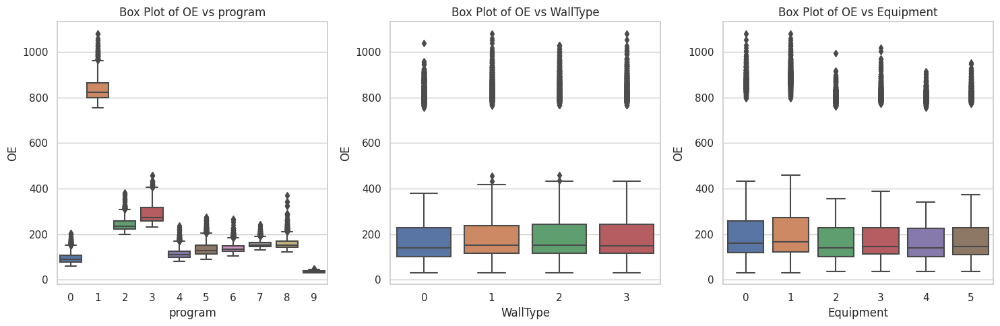

In [ ]:
#Explore the distribuion of categorical variables with respect to OE
sns.set(style="whitegrid")

# Create subplots for each categorical variable
fig, axes = plt.subplots(nrows=1, ncols=len(cat_cols), figsize=(15, 5))

# Loop through each categorical variable and create a box plot
for i, cat_col in enumerate(cat_cols):
    sns.boxplot(x=cat_col, y="OE", data=df_sel_du, ax=axes[i])
    axes[i].set_title(f'Box Plot of OE vs {cat_col}')

plt.tight_layout()
plt.show()

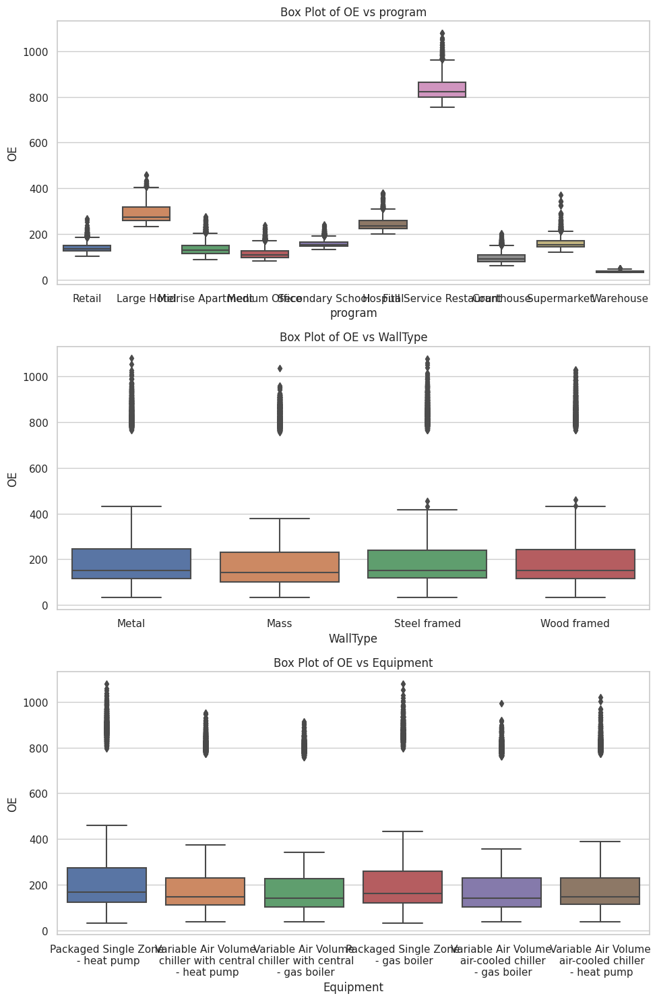

In [ ]:
df_sel_du["program"] = df_sel_du["program"].map(program_names)
df_sel_du["WallType"] = df_sel_du["WallType"].map(wall_names)
df_sel_du["Equipment"] = df_sel_du["Equipment"].map(equip_names)

# Set the style for the plots (optional)
sns.set(style="whitegrid")

# Create subplots for each categorical variable
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

# Loop through each categorical variable and create a box plot
for i, cat_col in enumerate(cat_cols):
    sns.boxplot(x=cat_col, y="OE", data=df_sel_du, ax=axes[i])
    axes[i].set_title(f'Box Plot of OE vs {cat_col}')

plt.tight_layout()
plt.show()

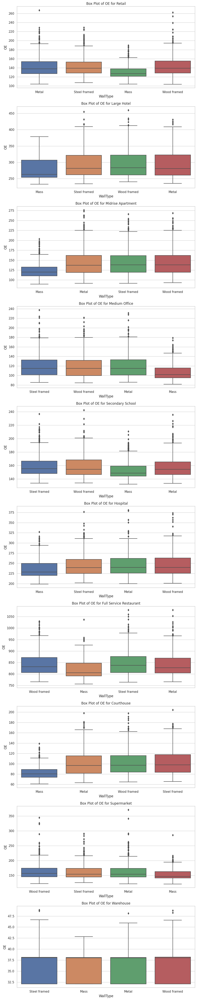

In [ ]:
cat_cols = ["program", "WallType"]

# Set the style for the plots (optional)
sns.set(style="whitegrid")

# Create subplots for each program
fig, axes = plt.subplots(nrows=len(df_sel_du["program"].unique()), ncols=1, figsize=(10, 5 * len(df_sel_du["program"].unique())))

# Loop through each program and create a box plot for each WallType
for i, program_value in enumerate(df_sel_du["program"].unique()):
    program_data = df_sel_du[df_sel_du["program"] == program_value]
    sns.boxplot(x="WallType", y="OE", data=program_data, ax=axes[i])
    axes[i].set_title(f'Box Plot of OE for {program_value}')

plt.tight_layout()
plt.show()

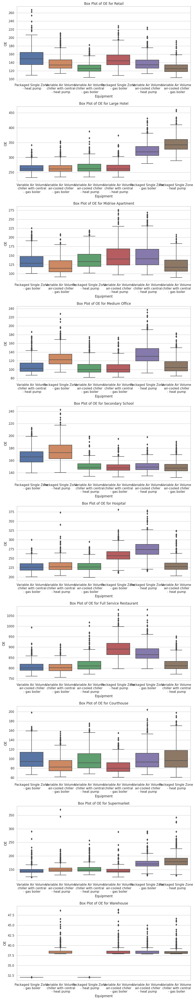

In [ ]:
cat_cols = ["program", "Equipment"]

# Set the style for the plots (optional)
sns.set(style="whitegrid")

# Create subplots for each program
fig, axes = plt.subplots(nrows=len(df_sel_du["program"].unique()), ncols=1, figsize=(10, 5 * len(df_sel_du["program"].unique())))

# Loop through each program and create a box plot for each WallType
for i, program_value in enumerate(df_sel_du["program"].unique()):
    program_data = df_sel_du[df_sel_du["program"] == program_value]
    sns.boxplot(x="Equipment", y="OE", data=program_data, ax=axes[i])
    axes[i].set_title(f'Box Plot of OE for {program_value}')

plt.tight_layout()
plt.show()

<br>
<hr>
<br>
<h1>Data Analysis PART 2</h1>
<br>
<hr>

In [ ]:
pred = pd.read_csv('https://raw.githubusercontent.com/snwnkang/CS109A_Final/main/data/Milestones1_3_data/predictors.csv')
resp = pd.read_csv('https://raw.githubusercontent.com/snwnkang/CS109A_Final/main/data/Milestones1_3_data/response.csv')

In [ ]:
pred.describe()

,Unnamed: 0,Orientation,nonMassWallR [m^2-K/W],MassWallR [m^2-K/W],RoofR [m^2-K/W],InteriorFloorR [m^2-K/W],ExteriorFloorR [m^2-K/W],WWRnorth,WWRwest,WWRsouth,...,program_4,program_5,program_6,program_7,program_8,program_9,WallType_0,WallType_1,WallType_2,WallType_3
count,32500.000000,32500.000000,32500.000000,32500.000000,32500.000000,3.250000e+04,32500.000000,32500.000000,32500.000000,32500.000000,...,32500.000000,32500.000000,32500.000000,32500.000000,32500.000000,32500.000000,32500.000000,32500.000000,32500.000000,32500.000000
mean,16249.500000,179.894585,2.384207,0.321344,5.930260,7.000000e-01,4.133882,0.516276,0.516068,0.516250,...,0.099569,0.102954,0.100431,0.100338,0.097077,0.099108,0.333169,0.222492,0.222215,0.222123
std,9382.086211,104.237783,1.472428,0.814431,1.614038,1.110240e-16,1.772313,0.264802,0.264985,0.264917,...,0.299429,0.303903,0.300578,0.300455,0.296067,0.298811,0.471354,0.415926,0.415742,0.415680
min,0.000000,0.000000,0.000000,0.000000,3.760000,7.000000e-01,0.610000,0.100000,0.100000,0.100000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,8124.750000,90.000000,1.500000,0.000000,4.640000,7.000000e-01,3.080000,0.290000,0.290000,0.290000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,16249.500000,180.000000,2.210000,0.000000,5.520000,7.000000e-01,4.680000,0.480000,0.480000,0.480000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,24374.250000,270.000000,3.580000,0.000000,6.400000,7.000000e-01,5.560000,0.820000,0.820000,0.820000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
max,32499.000000,360.000000,5.520000,3.790000,10.490000,7.000000e-01,6.610000,0.900000,0.900000,0.900000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
resp.describe()

,Unnamed: 0,OE
count,32500.000000,32500.000000
mean,16249.500000,221.072443
std,9382.086211,217.904817
min,0.000000,32.083522
25%,8124.750000,111.055418
50%,16249.500000,147.225634
75%,24374.250000,237.394306
max,32499.000000,1079.253552


In [ ]:
#InteriorFloorR is the same throughout the entire dataset (suggests a non-insulated floor type construction, which yields the same value across the entire data), so we drop this variable as it will not be useful nor helpful in our predictions
pred = pred.drop('InteriorFloorR [m^2-K/W]', axis=1)

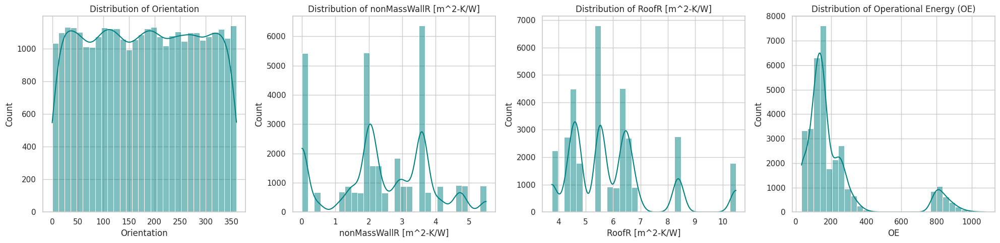

In [ ]:
plt.figure(figsize=(20, 5))

# Histogram of 'Orientation'
plt.subplot(1, 4, 1)
sns.histplot(pred['Orientation'], bins=30, kde=True, color="teal")
plt.title('Distribution of Orientation')

# Histogram of 'nonMassWallR [m^2-K/W]'
plt.subplot(1, 4, 2)
sns.histplot(pred['nonMassWallR [m^2-K/W]'], bins=30, kde=True, color="teal")
plt.title('Distribution of nonMassWallR [m^2-K/W]')

# Histogram of 'RoofR [m^2-K/W]'
plt.subplot(1, 4, 3)
sns.histplot(pred['RoofR [m^2-K/W]'], bins=30, kde=True, color="teal")
plt.title('Distribution of RoofR [m^2-K/W]')

# Histogram of 'OE' (response variable)
plt.subplot(1, 4, 4)
sns.histplot(resp['OE'], bins=30, kde=True, color="teal")
plt.title('Distribution of Operational Energy (OE)')


plt.tight_layout()
plt.show()

The summary statistics for the predictors reveal a variety of scales and distributions. For instance, the orientation seems uniformly distributed between 0 and 360 degrees, non-mass wall R-values range between 0 and 5.5, and roof R-values range between 3.76 and 10.49. The response variable, operational energy (OE), has a mean of approximately 221 with a wide standard deviation of about 217, indicating significant variation in energy consumption across the dataset.

The histograms for selected predictors and the operational energy suggest the following:

The Orientation histogram is approximately uniform, suggesting no particular orientation bias in the dataset.
nonMassWallR is non-uniform, with varying frequency of values
RoofR shows a slight right skew.
The operational energy distribution is right-skewed, with a few values significantly higher than the rest, which could be potential outliers or simply represent high-energy-consuming buildings.

In [ ]:
full_data = pd.concat([pred, resp], axis=1)

In [ ]:
#using a copy to retain the full_data intact just in case
fd_copy = full_data.copy()

In [ ]:
#Labeling one-hot-encoded variables
program_names = {
    'program_0': "Courthouse",
    'program_1': "Full Service Restaurant",
    'program_2': "Hospital",
    'program_3': "Large Hotel",
    'program_4': "Medium Office",
    'program_5': "Midrise Apartment",
    'program_6': "Retail",
    'program_7': "Secondary School",
    'program_8': "Supermarket",
    'program_9': "Warehouse",
}

wall_names = {
    'WallType_0': "Mass",
    'WallType_1': "Steel framed",
    'WallType_2': "Wood framed",
    'WallType_3': "Metal",
}

equip_names = {
    'Equipment_0': "Packaged Single Zone - gas boiler",
    'Equipment_1': "Packaged Single Zone - heat pump",
    'Equipment_2': "Variable Air Volume air-cooled chiller - gas boiler",
    'Equipment_3': "Variable Air Volume air-cooled chiller - heat pump",
    'Equipment_4': "Variable Air Volume chiller with central - gas boiler",
    'Equipment_5': "Variable Air Volume chiller with central - heat pump",
}

In [ ]:
fd_copy.rename(columns=program_names, inplace=True)
fd_copy.rename(columns=wall_names, inplace=True)
fd_copy.rename(columns=equip_names, inplace=True)

In [ ]:
fd_copy = fd_copy.drop(columns=['Unnamed: 0'])
fd_copy.head(5)

,Orientation,nonMassWallR [m^2-K/W],MassWallR [m^2-K/W],RoofR [m^2-K/W],ExteriorFloorR [m^2-K/W],WWRnorth,WWRwest,WWRsouth,WWReast,SHGC,...,Midrise Apartment,Retail,Secondary School,Supermarket,Warehouse,Mass,Steel framed,Wood framed,Metal,OE
0,348,2.88,0.00,8.38,5.38,0.23,0.11,0.58,0.15,0.36,...,0,1,0,0,0,0,0,0,1,141.615293
1,96,3.58,0.00,10.49,6.61,0.32,0.24,0.28,0.48,0.40,...,0,1,0,0,0,0,0,0,1,127.674846
2,182,2.21,0.00,5.52,3.43,0.38,0.37,0.56,0.13,0.38,...,0,0,0,0,0,1,0,0,0,255.768779
3,359,0.00,2.03,5.52,3.08,0.42,0.38,0.37,0.49,0.38,...,1,0,0,0,0,1,0,0,0,126.355396
4,317,2.02,0.00,4.40,4.68,0.90,0.90,0.90,0.90,0.25,...,0,0,0,0,0,0,1,0,0,124.733609


In [ ]:
all_renames = {**program_names, **wall_names, **equip_names}
categorical_columns = list(all_renames.values())
categorical_columns

['Courthouse',
 'Full Service Restaurant',
 'Hospital',
 'Large Hotel',
 'Medium Office',
 'Midrise Apartment',
 'Retail',
 'Secondary School',
 'Supermarket',
 'Warehouse',
 'Mass',
 'Steel framed',
 'Wood framed',
 'Metal',
 'Packaged Single Zone - gas boiler',
 'Packaged Single Zone - heat pump',
 'Variable Air Volume air-cooled chiller - gas boiler',
 'Variable Air Volume air-cooled chiller - heat pump',
 'Variable Air Volume chiller with central - gas boiler',
 'Variable Air Volume chiller with central - heat pump']

In [ ]:
numerical_columns = [col for col in fd_copy if col not in categorical_columns and col != 'OE']
numerical_columns

['Orientation',
 'nonMassWallR [m^2-K/W]',
 'MassWallR [m^2-K/W]',
 'RoofR [m^2-K/W]',
 'ExteriorFloorR [m^2-K/W]',
 'WWRnorth',
 'WWRwest',
 'WWRsouth',
 'WWReast',
 'SHGC',
 'WindowR [m^2-K/W]',
 'numFloor',
 'AspectRatio',
 'VolumeToFacadeRatio']

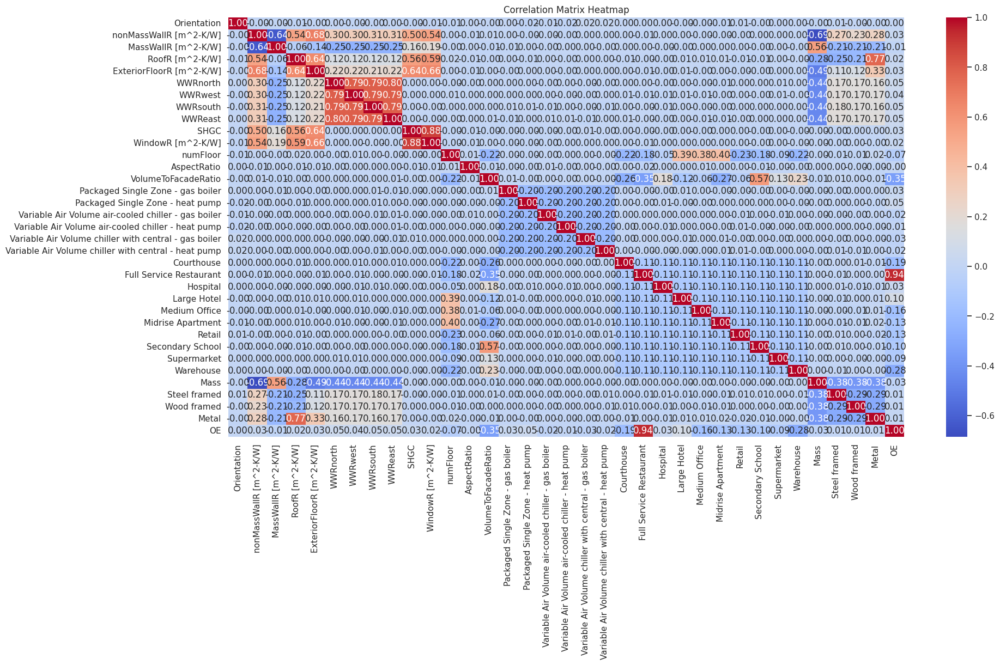

In [ ]:
correlation_matrix = fd_copy.corr()

plt.figure(figsize=(20, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title('Correlation Matrix Heatmap')
plt.show()

In [ ]:
correlation_matrix

,Orientation,nonMassWallR [m^2-K/W],MassWallR [m^2-K/W],RoofR [m^2-K/W],ExteriorFloorR [m^2-K/W],WWRnorth,WWRwest,WWRsouth,WWReast,SHGC,...,Midrise Apartment,Retail,Secondary School,Supermarket,Warehouse,Mass,Steel framed,Wood framed,Metal,OE
Orientation,1.000000,-0.001330,-0.002765,-0.007299,-0.003567,0.001848,-0.002675,-0.002532,0.001611,-0.004784,...,-0.010475,0.005451,-0.000301,0.001061,0.001641,-0.000796,0.005265,-0.000616,-0.003749,0.000017
nonMassWallR [m^2-K/W],-0.001330,1.000000,-0.638909,0.535895,0.679844,0.303868,0.304751,0.305721,0.305787,0.498685,...,-0.002830,-0.000857,0.001733,0.003310,0.001460,-0.685399,0.272396,0.229055,0.275551,0.031669
MassWallR [m^2-K/W],-0.002765,-0.638909,1.000000,-0.059873,-0.144050,-0.247307,-0.246290,-0.249377,-0.250139,0.161122,...,0.002868,0.001118,-0.002846,0.001535,-0.004329,0.558210,-0.211071,-0.210902,-0.210845,-0.011840
RoofR [m^2-K/W],-0.007299,0.535895,-0.059873,1.000000,0.641743,0.120713,0.121704,0.117645,0.121326,0.556446,...,0.013937,-0.010620,-0.009425,0.000495,-0.000595,-0.276908,-0.245318,-0.205999,0.765488,0.023404
ExteriorFloorR [m^2-K/W],-0.003567,0.679844,-0.144050,0.641743,1.000000,0.218610,0.217044,0.214189,0.216703,0.635554,...,0.002614,-0.001302,-0.000497,0.000970,0.000458,-0.492381,0.108516,0.116491,0.333239,0.028645
WWRnorth,0.001848,0.303868,-0.247307,0.120713,0.218610,1.000000,0.793916,0.794421,0.796287,0.002809,...,-0.010285,0.000099,0.002032,0.005876,0.000135,-0.442325,0.170935,0.166435,0.164072,0.054409
WWRwest,-0.002675,0.304751,-0.246290,0.121704,0.217044,0.793916,1.000000,0.794876,0.792825,0.001718,...,-0.000792,0.004812,-0.000320,0.005462,-0.000666,-0.444068,0.172602,0.165722,0.165093,0.041038
WWRsouth,-0.002532,0.305721,-0.249377,0.117645,0.214189,0.794421,0.794876,1.000000,0.794344,0.001101,...,-0.003644,0.000861,0.004019,0.001220,0.000220,-0.444411,0.177226,0.165167,0.161411,0.050374
WWReast,0.001611,0.305787,-0.250139,0.121326,0.216703,0.796287,0.792825,0.794344,1.000000,0.000318,...,-0.008049,-0.000553,0.003755,0.002212,0.000548,-0.443415,0.171560,0.165354,0.165763,0.046953
SHGC,-0.004784,0.498685,0.161122,0.556446,0.635554,0.002809,0.001718,0.001101,0.000318,1.000000,...,0.000550,0.003573,-0.002342,0.002215,-0.000929,-0.000618,-0.004616,0.004819,0.000500,0.031709


<hr>
<hr>
A correlation matrix is made and visualized in a heat map using seaborn to show relationships and correlation coefficients between variables. In this process we are trying to identify which variables have strong relationship with each other.

In the visualization, most interesting aspect is the VolumeToFacadeRatio having a negative correlation with Operational Energy (OE) of -0.35, suggesting that buildings with high volume to facade ratio tend to have lower operational energy consumptions, holding all variables constant. This is interesting in the context of building technology, as one may often assume that larger buildings would consume more energy, but as we are holding all other variables constant, we need to look into how the other variables influence the output.
<hr>
<hr>
<br>

**Class Imbalances**

Refer the plot below:
The data acquired has no class imbalances, all programs, wall types and equipment are well balanced in terms of data count

In [ ]:
#for counts
program_columns = [
    "Courthouse",
    "Full Service Restaurant",
    "Hospital",
    "Large Hotel",
    "Medium Office",
    "Midrise Apartment",
    "Retail",
    "Secondary School",
    "Supermarket",
    "Warehouse",
]

wall_columns = [
    "Mass",
    "Steel framed",
    "Wood framed",
    "Metal",
]

equip_columns = [
    "Packaged Single Zone - gas boiler",
    "Packaged Single Zone - heat pump",
    "Variable Air Volume air-cooled chiller - gas boiler",
    "Variable Air Volume air-cooled chiller - heat pump",
    "Variable Air Volume chiller with central - gas boiler",
    "Variable Air Volume chiller with central - heat pump",
]

equipment_counts = fd_copy[equip_columns].sum(axis=0)
program_counts = fd_copy[program_columns].sum(axis=0)
walltype_counts = fd_copy[wall_columns].sum(axis=0)

class_imbalances = {
    'Equipment': equipment_counts,
    'Program': program_counts,
    'WallType': walltype_counts
}

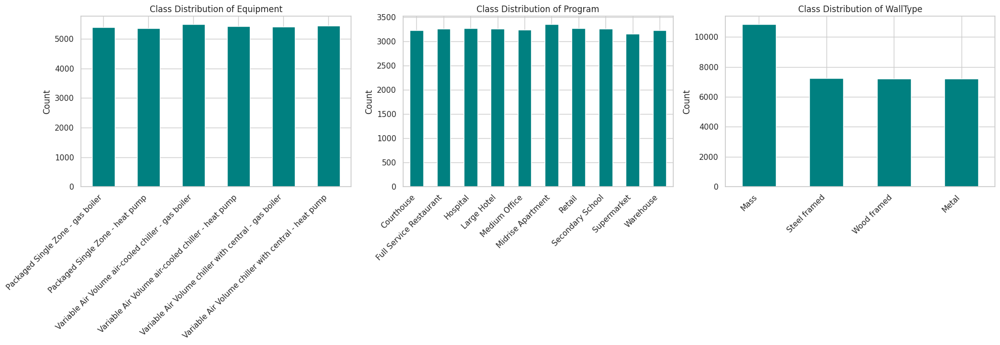

In [ ]:
fig, axes = plt.subplots(1, len(class_imbalances), figsize=(20, 7))

for i, (column, counts) in enumerate(class_imbalances.items()):
    ax = axes[i] if len(class_imbalances) > 1 else axes
    counts.plot(kind='bar', ax=ax, color='teal')
    ax.set_title(f'Class Distribution of {column}')
    ax.set_ylabel('Count')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

**Trend Analysis**

<p>The first plot below is the same plot as in PART 1, as an additional observation measure to cross-check<p>

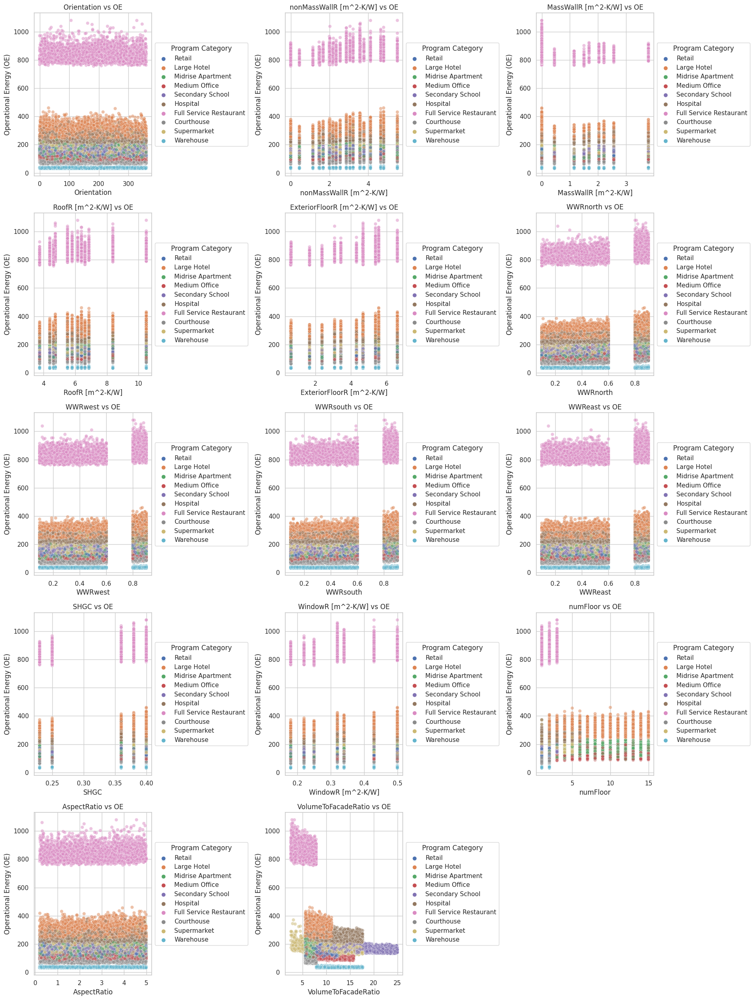

In [ ]:
fd_copy['Program_Category'] = fd_copy[program_columns].idxmax(axis=1)

num_plots = len(numerical_columns)
cols = 3
rows = num_plots // cols + (num_plots % cols > 0)

plt.figure(figsize=(cols * 7, rows * 5))

for i, num_col in enumerate(numerical_columns, 1):
    plt.subplot(rows, cols, i)
    sns.scatterplot(x=fd_copy[num_col], y=fd_copy['OE'], hue=fd_copy['Program_Category'], alpha=0.5)
    plt.title(f'{num_col} vs OE')
    plt.xlabel(num_col)
    plt.ylabel('Operational Energy (OE)')

    #Moving the legend outside so all data is visible...
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Program Category')

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

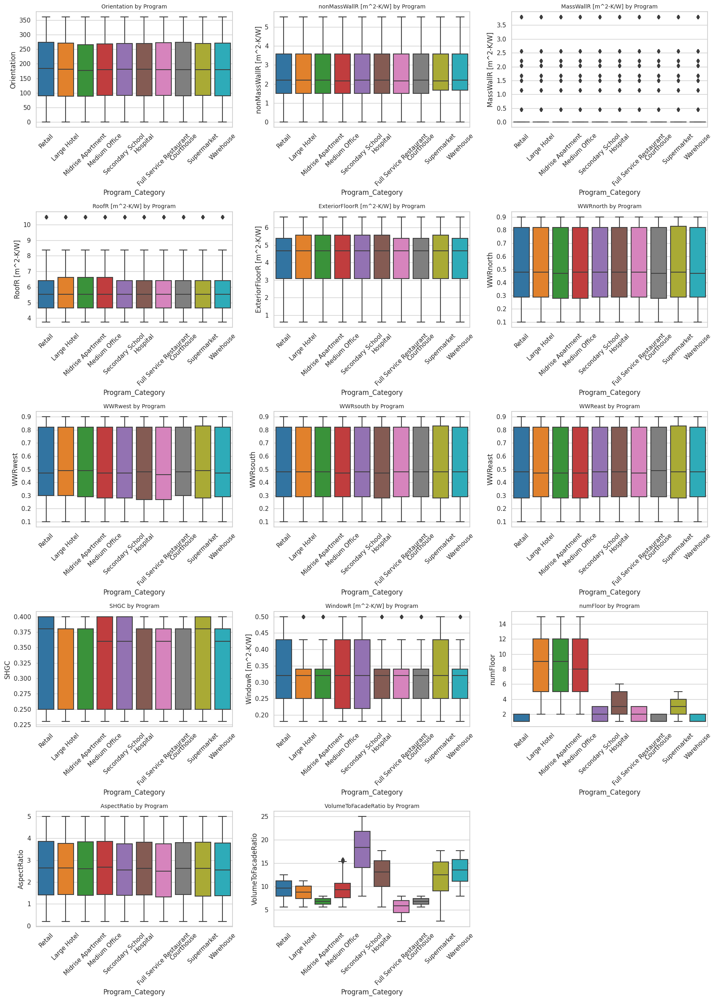

In [ ]:
cols = 3
rows = len(numerical_columns) // cols + (len(numerical_columns) % cols > 0)

fig, axs = plt.subplots(rows, cols, figsize=(cols * 6, rows * 5))

axs = axs.flatten()

for i in range(len(numerical_columns)):
    ax = axs[i]
    sns.boxplot(x='Program_Category', y=numerical_columns[i], data=fd_copy, ax=ax, palette='tab10')
    ax.set_title(f'{numerical_columns[i]} by Program', fontsize=10)
    ax.set_ylabel(numerical_columns[i])
    ax.tick_params(axis='x', rotation=45)

for j in range(i+1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

<hr>
<h4>End of Exploratory Data Analysis</h4>
<hr>
<br>
<br>
<hr>
<hr>
<h1>Model Search</h1>
<hr>
<hr>

In [ ]:
import sys
import numpy as np
import scipy as sp
import pandas as pd
import sklearn as sk
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV, LogisticRegressionCV
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingRegressor, RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import accuracy_score, f1_score, r2_score, mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn import datasets
from sklearn.preprocessing import PolynomialFeatures
import time
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

from warnings import simplefilter
simplefilter('ignore', category=UserWarning) # ignore 'fit without feature names' warning
simplefilter('ignore', category=FutureWarning) # ignore XGBoost warning about is_categorical_dtype

<h1>Data Importing<h1>
<ul>
<li>full_df contains everything, including the one-hot-encoded/labeled variables and the response all together
<li>pred contains only the predictors
<li>resp contains the response variable Operational Energy
<ul>
<p>The steps below are to roughly prepare the data for usage, getting rid of the index columns and verifying the data is correct<p>

In [ ]:
full_df = pd.read_csv("https://raw.githubusercontent.com/snwnkang/CS109A_Final/main/data/Milestone4_data/Full_data.csv")
pred = pd.read_csv("https://raw.githubusercontent.com/snwnkang/CS109A_Final/main/data/Milestone4_data/Predictors_data.csv")
resp = pd.read_csv("https://raw.githubusercontent.com/snwnkang/CS109A_Final/main/data/Milestone4_data/Response_data.csv")

In [ ]:
#Dropping index columns
full_df = full_df.drop('Unnamed: 0', axis=1)
pred = pred.drop('Unnamed: 0', axis=1)
resp = resp.drop('Unnamed: 0', axis=1)

In [ ]:
full_df.head(5)

,Orientation,nonMassWallR [m^2-K/W],MassWallR [m^2-K/W],RoofR [m^2-K/W],ExteriorFloorR [m^2-K/W],WWRnorth,WWRwest,WWRsouth,WWReast,SHGC,...,Midrise Apartment,Retail,Secondary School,Supermarket,Warehouse,Mass,Steel framed,Wood framed,Metal,OE
0,348,2.88,0.00,8.38,5.38,0.23,0.11,0.58,0.15,0.36,...,0,1,0,0,0,0,0,0,1,141.615293
1,96,3.58,0.00,10.49,6.61,0.32,0.24,0.28,0.48,0.40,...,0,1,0,0,0,0,0,0,1,127.674846
2,182,2.21,0.00,5.52,3.43,0.38,0.37,0.56,0.13,0.38,...,0,0,0,0,0,1,0,0,0,255.768779
3,359,0.00,2.03,5.52,3.08,0.42,0.38,0.37,0.49,0.38,...,1,0,0,0,0,1,0,0,0,126.355396
4,317,2.02,0.00,4.40,4.68,0.90,0.90,0.90,0.90,0.25,...,0,0,0,0,0,0,1,0,0,124.733609


In [ ]:
pred.head(5)

,Orientation,nonMassWallR [m^2-K/W],MassWallR [m^2-K/W],RoofR [m^2-K/W],ExteriorFloorR [m^2-K/W],WWRnorth,WWRwest,WWRsouth,WWReast,SHGC,...,Medium Office,Midrise Apartment,Retail,Secondary School,Supermarket,Warehouse,Mass,Steel framed,Wood framed,Metal
0,348,2.88,0.00,8.38,5.38,0.23,0.11,0.58,0.15,0.36,...,0,0,1,0,0,0,0,0,0,1
1,96,3.58,0.00,10.49,6.61,0.32,0.24,0.28,0.48,0.40,...,0,0,1,0,0,0,0,0,0,1
2,182,2.21,0.00,5.52,3.43,0.38,0.37,0.56,0.13,0.38,...,0,0,0,0,0,0,1,0,0,0
3,359,0.00,2.03,5.52,3.08,0.42,0.38,0.37,0.49,0.38,...,0,1,0,0,0,0,1,0,0,0
4,317,2.02,0.00,4.40,4.68,0.90,0.90,0.90,0.90,0.25,...,1,0,0,0,0,0,0,1,0,0


In [ ]:
resp.head(5)

,OE
0,141.615293
1,127.674846
2,255.768779
3,126.355396
4,124.733609


<hr>
<hr>
<h1>Polynomial Regression + Lasso Regularization<h1>
<hr>
<hr>

In [ ]:
# Separate predictors and response
X, y = pred, resp
# Train/Test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
X_train.shape

(26000, 34)

In [ ]:
X_train.columns

Index(['Orientation', 'nonMassWallR [m^2-K/W]', 'MassWallR [m^2-K/W]',
       'RoofR [m^2-K/W]', 'ExteriorFloorR [m^2-K/W]', 'WWRnorth', 'WWRwest',
       'WWRsouth', 'WWReast', 'SHGC', 'WindowR [m^2-K/W]', 'numFloor',
       'AspectRatio', 'VolumeToFacadeRatio',
       'Packaged Single Zone - gas boiler', 'Packaged Single Zone - heat pump',
       'Variable Air Volume air-cooled chiller - gas boiler',
       'Variable Air Volume air-cooled chiller - heat pump',
       'Variable Air Volume chiller with central - gas boiler',
       'Variable Air Volume chiller with central - heat pump', 'Courthouse',
       'Full Service Restaurant', 'Hospital', 'Large Hotel', 'Medium Office',
       'Midrise Apartment', 'Retail', 'Secondary School', 'Supermarket',
       'Warehouse', 'Mass', 'Steel framed', 'Wood framed', 'Metal'],
      dtype='object')

In [ ]:
#dopping one of each categorical predictors
X_train_used = X_train.drop(columns=["Packaged Single Zone - gas boiler" , "Courthouse", "Metal"])

In [ ]:
X_test_used = X_test.drop(columns=["Packaged Single Zone - gas boiler" , "Courthouse", "Metal"])

In [ ]:
X_train_used.shape, X_test_used.shape

((26000, 31), (6500, 31))

In [ ]:
X_train_used.columns

Index(['Orientation', 'nonMassWallR [m^2-K/W]', 'MassWallR [m^2-K/W]',
       'RoofR [m^2-K/W]', 'ExteriorFloorR [m^2-K/W]', 'WWRnorth', 'WWRwest',
       'WWRsouth', 'WWReast', 'SHGC', 'WindowR [m^2-K/W]', 'numFloor',
       'AspectRatio', 'VolumeToFacadeRatio',
       'Packaged Single Zone - heat pump',
       'Variable Air Volume air-cooled chiller - gas boiler',
       'Variable Air Volume air-cooled chiller - heat pump',
       'Variable Air Volume chiller with central - gas boiler',
       'Variable Air Volume chiller with central - heat pump',
       'Full Service Restaurant', 'Hospital', 'Large Hotel', 'Medium Office',
       'Midrise Apartment', 'Retail', 'Secondary School', 'Supermarket',
       'Warehouse', 'Mass', 'Steel framed', 'Wood framed'],
      dtype='object')

In [ ]:
X_train_used.head(1)

,Orientation,nonMassWallR [m^2-K/W],MassWallR [m^2-K/W],RoofR [m^2-K/W],ExteriorFloorR [m^2-K/W],WWRnorth,WWRwest,WWRsouth,WWReast,SHGC,...,Large Hotel,Medium Office,Midrise Apartment,Retail,Secondary School,Supermarket,Warehouse,Mass,Steel framed,Wood framed
4825,293,3.6,0.0,5.81,5.56,0.85,0.85,0.85,0.85,0.38,...,0,0,0,1,0,0,0,0,1,0


In [ ]:
#extracting quatitative variables
X_train_used_quant = X_train_used.drop(columns=['Packaged Single Zone - heat pump',
       'Variable Air Volume air-cooled chiller - gas boiler',
       'Variable Air Volume air-cooled chiller - heat pump',
       'Variable Air Volume chiller with central - gas boiler',
       'Variable Air Volume chiller with central - heat pump',
       'Full Service Restaurant', 'Hospital', 'Large Hotel', 'Medium Office',
       'Midrise Apartment', 'Retail', 'Secondary School', 'Supermarket',
       'Warehouse', 'Mass', 'Steel framed', 'Wood framed'])
X_test_used_quant = X_test_used.drop(columns=['Packaged Single Zone - heat pump',
       'Variable Air Volume air-cooled chiller - gas boiler',
       'Variable Air Volume air-cooled chiller - heat pump',
       'Variable Air Volume chiller with central - gas boiler',
       'Variable Air Volume chiller with central - heat pump',
       'Full Service Restaurant', 'Hospital', 'Large Hotel', 'Medium Office',
       'Midrise Apartment', 'Retail', 'Secondary School', 'Supermarket',
       'Warehouse', 'Mass', 'Steel framed', 'Wood framed'])

In [ ]:
X_train_used_quant.shape , X_test_used_quant.shape

((26000, 14), (6500, 14))

In [ ]:
X_train_used_cat = X_train_used.drop(columns=['Orientation', 'nonMassWallR [m^2-K/W]', 'MassWallR [m^2-K/W]',
       'RoofR [m^2-K/W]', 'ExteriorFloorR [m^2-K/W]', 'WWRnorth', 'WWRwest',
       'WWRsouth', 'WWReast', 'SHGC', 'WindowR [m^2-K/W]', 'numFloor',
       'AspectRatio', 'VolumeToFacadeRatio'])
X_test_used_cat = X_test_used.drop(columns=['Orientation', 'nonMassWallR [m^2-K/W]', 'MassWallR [m^2-K/W]',
       'RoofR [m^2-K/W]', 'ExteriorFloorR [m^2-K/W]', 'WWRnorth', 'WWRwest',
       'WWRsouth', 'WWReast', 'SHGC', 'WindowR [m^2-K/W]', 'numFloor',
       'AspectRatio', 'VolumeToFacadeRatio'])

In [ ]:
X_train_used_cat.shape , X_test_used_cat.shape

((26000, 17), (6500, 17))

In [ ]:
#Scaling quantitative preditcors

In [ ]:
scaler = StandardScaler().fit(X_train_used_quant)
X_train_quant_sc = scaler.transform(X_train_used_quant)
X_test_quant_sc = scaler.transform(X_test_used_quant)

In [ ]:
X_train_quant_sc.shape , X_test_quant_sc.shape

((26000, 14), (6500, 14))

In [ ]:
# Finding the best hyper-parameter alpha

In [ ]:
# I will test the alpha values by convention tested in class
alpha_list = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1]

In [ ]:
# I will test for polynomial to the 30th degree to find the alpha,
# again based on convention of what we did in class
max_degree = 5

In [ ]:
# Setting those up, the way we have done in class
include_bias = False
fit_intercept = True
max_iter = 100

In [ ]:
poly = PolynomialFeatures(max_degree, include_bias=include_bias).fit(X_train_quant_sc)

In [ ]:
X_train_quant_sc_poly = poly.transform(X_train_quant_sc)
X_train_quant_sc_poly.shape

(26000, 11627)

In [ ]:
X_test_quant_sc_poly = poly.transform(X_test_quant_sc)
X_test_quant_sc_poly.shape

(6500, 11627)

In [ ]:
X_train_used_cat.shape

(26000, 17)

In [ ]:
X_train_quant_sc_poly = pd.DataFrame(X_train_quant_sc_poly)
X_train_used_cat = pd.DataFrame(X_train_used_cat, columns = X_test_used_cat.columns)

In [ ]:
X_train_used_cat.head()

,Packaged Single Zone - heat pump,Variable Air Volume air-cooled chiller - gas boiler,Variable Air Volume air-cooled chiller - heat pump,Variable Air Volume chiller with central - gas boiler,Variable Air Volume chiller with central - heat pump,Full Service Restaurant,Hospital,Large Hotel,Medium Office,Midrise Apartment,Retail,Secondary School,Supermarket,Warehouse,Mass,Steel framed,Wood framed
4825,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0
23440,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0
11879,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0
11758,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
5937,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [ ]:
X_train_quant_sc_poly.shape

(26000, 11627)

In [ ]:
X_train_quant_sc_poly.columns = X_train_quant_sc_poly.columns.astype(str)

In [ ]:
X_train_used_cat.columns = X_train_used_cat.columns.astype(str)

In [ ]:
X_train_used_cat.shape

(26000, 17)

In [ ]:
X_train_used_cat_reset = X_train_used_cat.reset_index(drop=True)
X_train_quant_sc_poly_reset = X_train_quant_sc_poly.reset_index(drop=True)

In [ ]:
X_train_quant_sc_poly_cat = pd.concat([X_train_used_cat_reset, X_train_quant_sc_poly_reset], axis=1)

In [ ]:
X_train_quant_sc_poly_cat.shape

(26000, 11644)

In [ ]:
max_degree = 2

In [ ]:
poly = PolynomialFeatures(max_degree, include_bias=include_bias)

#Fit to the standardized quantitative training data and transform both train and test data
X_train_quant_sc_poly = poly.fit_transform(X_train_quant_sc)
X_test_quant_sc_poly = poly.transform(X_test_quant_sc)

#Convert the transformed training data back to DataFrame and reset index for concatenation
X_train_quant_sc_poly_df = pd.DataFrame(X_train_quant_sc_poly)
X_train_used_cat_reset = X_train_used_cat.reset_index(drop=True)

#Concatenate the categorical and polynomial features DataFrames
X_train_poly_cat = pd.concat([X_train_used_cat_reset, X_train_quant_sc_poly_df], axis=1)

#Get the shapes of the transformed data to confirm the process
X_train_poly_cat_shape = X_train_poly_cat.shape
X_test_quant_sc_poly_shape = X_test_quant_sc_poly.shape

X_train_poly_cat_shape, X_test_quant_sc_poly_shape

((26000, 136), (6500, 119))

In [ ]:
fit_intercept = True
max_iter = 100

#Initialize LassoCV with the list of alphas, fit_intercept, and max_iter
#LassoCV will perform cross-validation to find the best alpha value
lasso_cv = LassoCV(alphas=alpha_list, fit_intercept=fit_intercept, max_iter=max_iter, cv=5, random_state=42)

#Fit the LassoCV model to the training data
X_train_poly_cat.columns = X_train_poly_cat.columns.astype(str)

#Now fit the LassoCV model to the training data
lasso_cv.fit(X_train_poly_cat, y_train.values.ravel())

#The best alpha value after cross-validation
best_alpha = lasso_cv.alpha_

#Coefficients of the Lasso model
lasso_coefficients = lasso_cv.coef_

#Performance metrics: mean squared error for each alpha
mse_path = lasso_cv.mse_path_

#Average mean squared error for each alpha
avg_mse = mse_path.mean(axis=1)

#R-squared score on the training data
r_squared_train = lasso_cv.score(X_train_poly_cat, y_train)

best_alpha, avg_mse, r_squared_train

(0.01,
 array([297.76955553, 287.14796908, 287.17201641, 287.18894266,
        287.19263782]),
 0.9939784713678153)

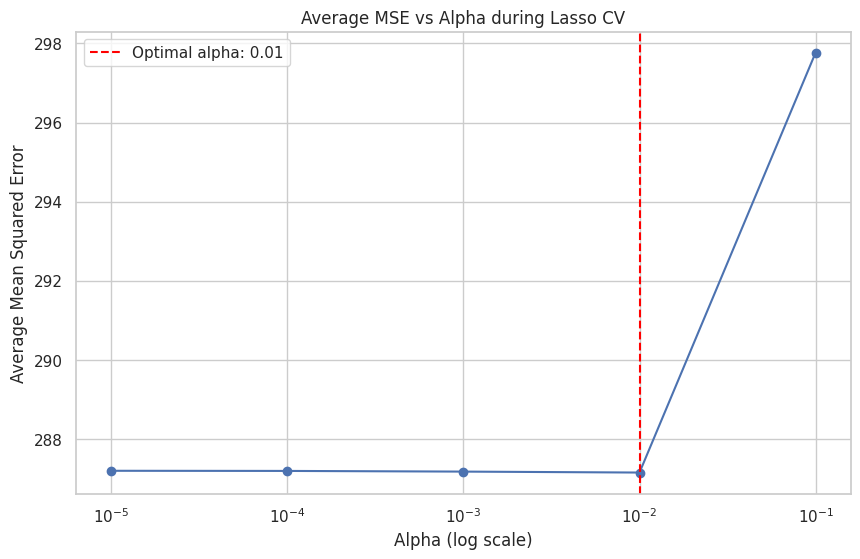

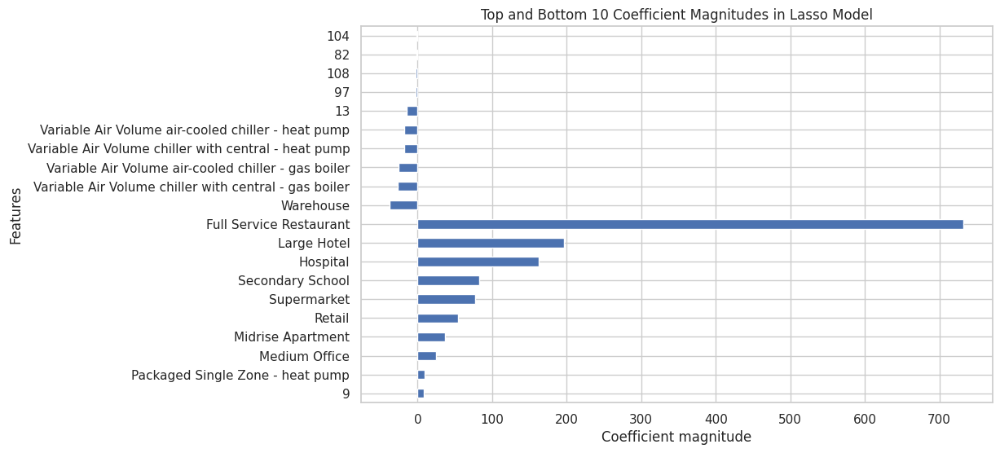

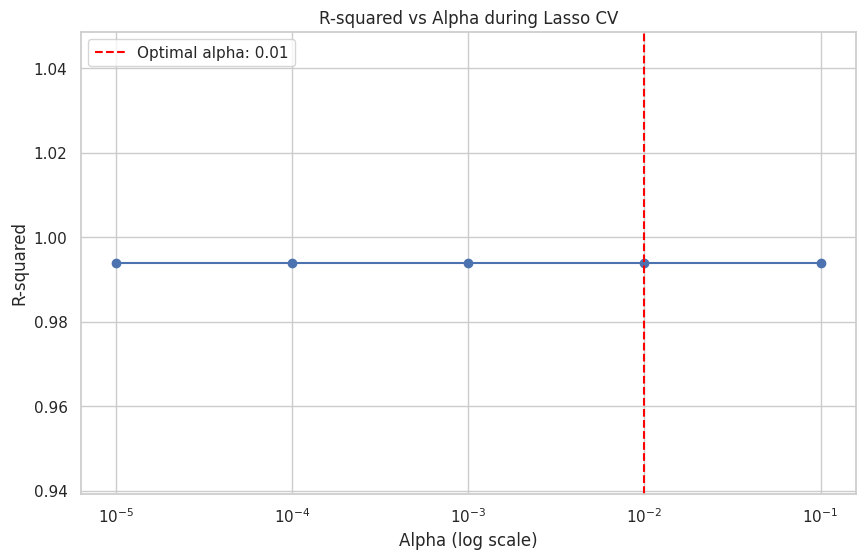

In [ ]:
plt.figure(figsize=(10, 6))
plt.semilogx(lasso_cv.alphas_, avg_mse, '-o')
plt.xlabel('Alpha (log scale)')
plt.ylabel('Average Mean Squared Error')
plt.title('Average MSE vs Alpha during Lasso CV')
plt.axvline(lasso_cv.alpha_, color='red', linestyle='--', label=f'Optimal alpha: {best_alpha}')
plt.legend()
plt.grid(True)
plt.show()

#Plot the coefficient magnitudes
plt.figure(figsize=(10, 6))
coefs = pd.Series(lasso_coefficients, index=X_train_poly_cat.columns)
sorted_coefs = coefs.sort_values()
top_coefs = sorted_coefs[-10:].append(sorted_coefs[:10])  #show top and bottom 10
top_coefs.plot(kind='barh')
plt.title('Top and Bottom 10 Coefficient Magnitudes in Lasso Model')
plt.xlabel('Coefficient magnitude')
plt.ylabel('Features')
plt.grid(True)
plt.show()

#R-squared score on the training data
plt.figure(figsize=(10, 6))
r_squared_values = [lasso_cv.score(X_train_poly_cat, y_train) for alpha in lasso_cv.alphas_]
plt.semilogx(lasso_cv.alphas_, r_squared_values, '-o')
plt.xlabel('Alpha (log scale)')
plt.ylabel('R-squared')
plt.title('R-squared vs Alpha during Lasso CV')
plt.axvline(lasso_cv.alpha_, color='red', linestyle='--', label=f'Optimal alpha: {best_alpha}')
plt.legend()
plt.grid(True)
plt.show()

**Average MSE vs Alpha during Lasso CV:**

The first plot shows the relationship between different alpha values and the average Mean Squared Error (MSE) across cross-validation folds.
The red dashed line indicates the optimal alpha value (0.01), which is the regularization strength that resulted in the lowest average MSE.
We see that as alpha increases beyond this optimal value, the average MSE increases sharply, indicating that too much regularization is detrimental to the model's performance.

**Top and Bottom 10 Coefficient Magnitudes in Lasso Model:**

The second plot shows the magnitudes of the top and bottom 10 coefficients in the Lasso model.
The features on the left have negative coefficients, and those on the right have positive coefficients.
Large positive values indicate a strong positive impact on the response variable, while large negative values indicate a strong negative impact.
This visualization helps in understanding which features are most influential in the Lasso model. It's important to note that the sign of the coefficient indicates the direction of the relationship, while the magnitude indicates the strength.

**R-squared vs Alpha during Lasso CV:**

The third plot illustrates how the R-squared value of the model varies with different alpha values.
In this plot, we can see that the R-squared value remains fairly consistent across the range of alphas, suggesting that the model's explanatory power is robust to the regularization strength, up until the optimal alpha is reached.
Beyond the optimal alpha, the model's explanatory power isn't shown, but we could expect it to decrease as the model becomes overly regularized.

In [ ]:
X_test_poly = poly.transform(X_test_quant_sc)  #Transform the test set with the same polynomial features
X_test_poly_cat = pd.concat([X_test_used_cat.reset_index(drop=True), pd.DataFrame(X_test_poly)], axis=1)
X_test_poly_cat.columns = X_test_poly_cat.columns.astype(str)  #Ensure column names are strings
y_pred_poly = lasso_cv.predict(X_test_poly_cat)

#Calculate performance metrics on the test set
test_mse = mean_squared_error(y_test, y_pred_poly)
test_r2_poly = r2_score(y_test, y_pred_poly)

#Output the test MSE and R-squared values
print(f"Test MSE: {test_mse}")
print(f"Test R-squared: {test_r2_poly}")

#Coefficient analysis
coefs = pd.Series(lasso_cv.coef_, index=X_train_poly_cat.columns)

mse_poly = mean_squared_error(y_test, y_pred_poly)
rmse_poly = np.sqrt(mse_poly)

Test MSE: 302.5812751236815
Test R-squared: 0.9937545763948497


In [ ]:
mse_poly, rmse_poly, test_r2_poly

(302.5812751236815, 17.394863469532652, 0.9937545763948497)

In [ ]:
coefs

Packaged Single Zone - heat pump                          9.011407
Variable Air Volume air-cooled chiller - gas boiler     -26.111149
Variable Air Volume air-cooled chiller - heat pump      -18.021311
Variable Air Volume chiller with central - gas boiler   -26.394889
Variable Air Volume chiller with central - heat pump    -18.492417
                                                           ...    
114                                                       0.227077
115                                                       1.448140
116                                                       1.380307
117                                                      -1.497874
118                                                       4.629744
Length: 136, dtype: float64

In [ ]:
###make a dataframe to save all significant performance metrics for each model
model_comparison = pd.DataFrame(columns=['Model', 'MSE', 'RMSE', 'R2'])

In [ ]:
def add_model_results(model_comparison, model_name, mse, rmse, r2):
    # This function appends the results to the dataframe and returns the updated dataframe
    return model_comparison.append({
        'Model': model_name,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2
    }, ignore_index=True)

In [ ]:
model_comparison = add_model_results(model_comparison, 'Polynomial Regression with Lasso', mse_poly, rmse_poly, test_r2_poly)

In [ ]:
model_comparison

,Model,MSE,RMSE,R2
0,Polynomial Regression with Lasso,302.581275,17.394863,0.993755


<hr>
Examing the polynomial features and understand interactions
<hr>

In [ ]:
original_feature_names = X_train_used_quant.columns

poly_feature_names = poly.get_feature_names_out(input_features=original_feature_names)

combined_feature_names = list(X_train_used_cat.columns) + list(poly_feature_names)

feature_coefficients = pd.Series(lasso_cv.coef_, index=combined_feature_names)

sorted_features = feature_coefficients.abs().sort_values(ascending=False)

print(sorted_features)

Full Service Restaurant                         732.561492
Large Hotel                                     196.112779
Hospital                                        162.613168
Secondary School                                 82.507570
Supermarket                                      77.660246
                                                   ...    
MassWallR [m^2-K/W] RoofR [m^2-K/W]               0.000000
WWReast WindowR [m^2-K/W]                         0.000000
nonMassWallR [m^2-K/W] SHGC                       0.000000
ExteriorFloorR [m^2-K/W]                          0.000000
ExteriorFloorR [m^2-K/W] VolumeToFacadeRatio      0.000000
Length: 136, dtype: float64


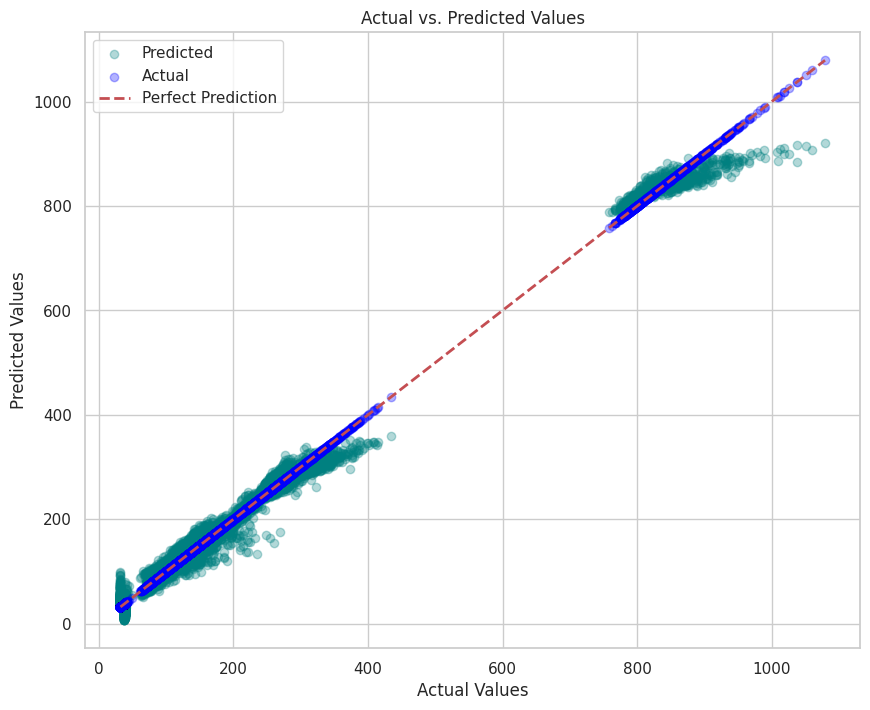

In [ ]:
plt.figure(figsize=(10, 8))
plt.scatter(y_test, y_pred_poly, alpha=0.3, c='teal', label='Predicted')
plt.scatter(y_test, y_test, alpha=0.3, c='blue', label='Actual')

plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label='Perfect Prediction')

plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs. Predicted Values')
plt.legend()
plt.show()

<hr>
<hr>
<h1>Decision Tree<h1>
<hr>
<hr>

In [ ]:
lin_model = LinearRegression()

# Train the model
lin_model.fit(X_train, y_train)

# Predict and evaluate
y_pred_lin = lin_model.predict(X_test)
mse_lin=mean_squared_error(y_test, y_pred_lin)
rmse_lin=mean_squared_error(y_test, y_pred_lin, squared=False)
r2_lin=r2_score(y_test, y_pred_lin)
print("RMSE:", mean_squared_error(y_test, y_pred_lin, squared=False))
print("R^2:", r2_score(y_test, y_pred_lin))

RMSE: 19.51634662975555
R^2: 0.9921382922085765


In [ ]:
model_comparison = add_model_results(model_comparison, 'Linear Regression', mse_lin, rmse_lin, r2_lin)
model_comparison

,Model,MSE,RMSE,R2
0,Polynomial Regression with Lasso,302.581275,17.394863,0.993755
1,Linear Regression,380.887786,19.516347,0.992138


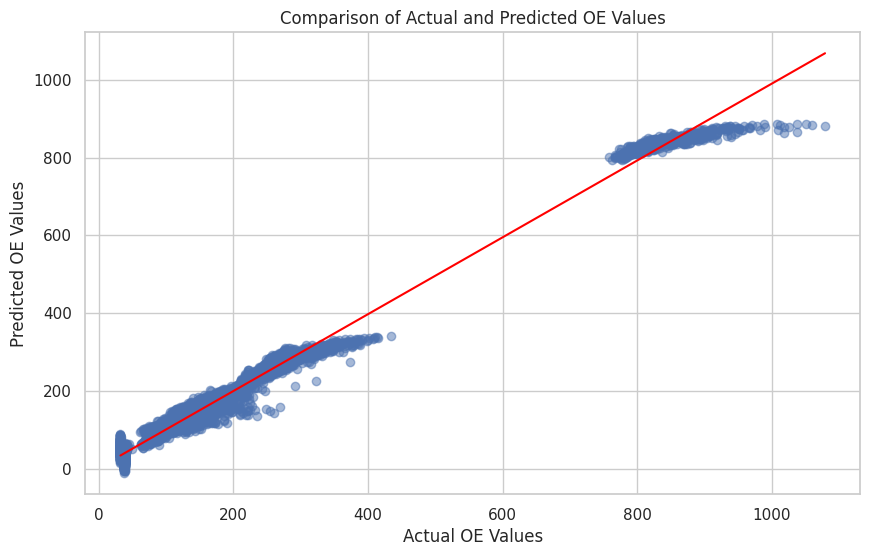

In [ ]:
y_test_1d = y_test.values.ravel() if hasattr(y_test, 'values') else np.array(y_test).flatten()
y_pred_lin_1d = y_pred_lin.flatten()

plt.figure(figsize=(10,6))
plt.scatter(y_test_1d, y_pred_lin_1d, alpha=0.5)
plt.xlabel('Actual OE Values')
plt.ylabel('Predicted OE Values')
plt.title('Comparison of Actual and Predicted OE Values')

plt.plot(np.unique(y_test_1d), np.poly1d(np.polyfit(y_test_1d, y_pred_lin_1d, 1))(np.unique(y_test_1d)), color='red')

plt.show()

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer

# Preprocessing for numerical and categorical data
numeric_features = X_train.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X_train.select_dtypes(include=['object']).columns

numeric_transformer = Pipeline(steps=[('scaler', StandardScaler())])
categorical_transformer = Pipeline(steps=[('onehot', OneHotEncoder(handle_unknown='ignore'))])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Creating a pipeline
lin_model2 = Pipeline(steps=[('preprocessor', preprocessor),
                             ('regressor', LinearRegression())])

# Train the model
lin_model2.fit(X_train, y_train)

# Predict and evaluate
y_pred_lin2 = lin_model2.predict(X_test)
mse_lin2 = mean_squared_error(y_test, y_pred_lin2)
rmse_lin2 = mean_squared_error(y_test, y_pred_lin2, squared=False)
r2_lin2 = r2_score(y_test, y_pred_lin2)

print("RMSE with preprocessing:", rmse_lin2)
print("R^2 with preprocessing:", r2_lin2)

RMSE with preprocessing: 19.516233835334702
R^2 with preprocessing: 0.9921383830815489


In [ ]:
model_comparison = add_model_results(model_comparison, 'Linear Regression with Preprocessing', mse_lin2, rmse_lin2, r2_lin2)

In [ ]:
model_comparison

,Model,MSE,RMSE,R2
0,Polynomial Regression with Lasso,302.581275,17.394863,0.993755
1,Linear Regression,380.887786,19.516347,0.992138
2,Linear Regression with Preprocessing,380.883383,19.516234,0.992138


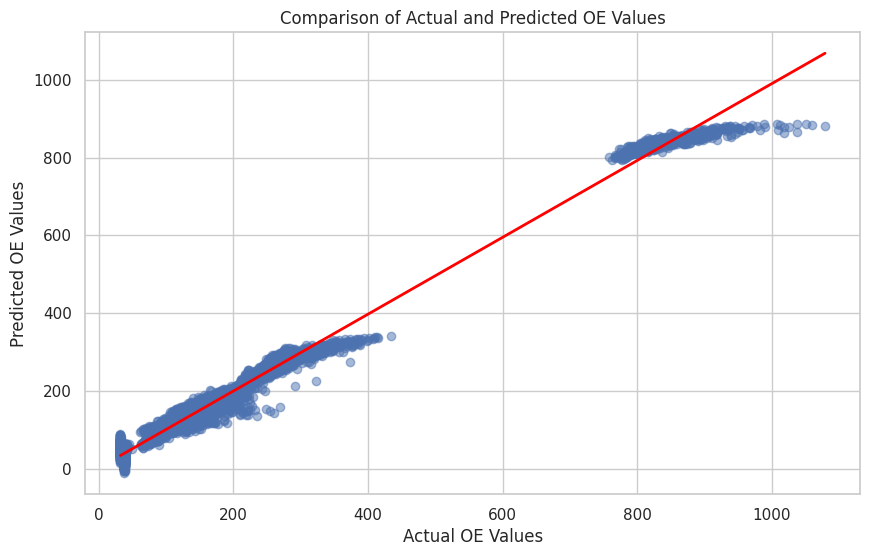

In [ ]:
y_test_1d = y_test.values.ravel() if hasattr(y_test, 'values') else np.array(y_test).flatten()
y_pred_lin2_1d = y_pred_lin2.flatten() if y_pred_lin2.ndim > 1 else y_pred_lin2

plt.figure(figsize=(10,6))
plt.scatter(y_test_1d, y_pred_lin2_1d, alpha=0.5)
plt.xlabel('Actual OE Values')
plt.ylabel('Predicted OE Values')
plt.title('Comparison of Actual and Predicted OE Values')

coefficients = np.polyfit(y_test_1d, y_pred_lin2_1d, 1)
polynomial = np.poly1d(coefficients)
xs = np.linspace(y_test_1d.min(), y_test_1d.max())
plt.plot(xs, polynomial(xs), color='red', linewidth=2)

plt.show()

Polynomial Regression with Lasso: This model has the lowest MSE and RMSE, and the highest R-squared value. This indicates that among the models you've run so far, it performs the best in terms of both the closeness of prediction (as indicated by the low MSE and RMSE) and the proportion of variance explained (as indicated by the high R-squared).

Linear Regression and Linear Regression with Preprocessing: These two models have very similar performance metrics to each other. Their MSE and RMSE are higher than those of the Polynomial Regression with Lasso, and their R-squared values are slightly lower. This suggests that the linear model, whether with preprocessing or without, does not predict as closely as the polynomial regression with Lasso and explains slightly less of the variance in the response variable.

The Polynomial Regression with Lasso is currently the best-performing model according to these metrics. It suggests that the relationship between the predictors and response variable may not be strictly linear, and that the Lasso regularization helps in improving the model performance by possibly addressing overfitting and selecting more relevant features.

<hr>
<hr>
<h1>Principal Component Analysis<h1>
<hr>
<hr>

In [ ]:
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_train_std =pd.DataFrame(X_train_std, columns=X_train.columns, index=X_train.index)

X_test_std = scaler.transform(X_test)

In [ ]:
X_train_std.describe()

,Orientation,nonMassWallR [m^2-K/W],MassWallR [m^2-K/W],RoofR [m^2-K/W],ExteriorFloorR [m^2-K/W],WWRnorth,WWRwest,WWRsouth,WWReast,SHGC,...,Medium Office,Midrise Apartment,Retail,Secondary School,Supermarket,Warehouse,Mass,Steel framed,Wood framed,Metal
count,2.600000e+04,2.600000e+04,2.600000e+04,2.600000e+04,2.600000e+04,2.600000e+04,2.600000e+04,2.600000e+04,2.600000e+04,2.600000e+04,...,2.600000e+04,2.600000e+04,2.600000e+04,2.600000e+04,2.600000e+04,2.600000e+04,2.600000e+04,2.600000e+04,2.600000e+04,2.600000e+04
mean,5.288078e-17,1.683440e-16,-6.968785e-18,1.097242e-16,-2.468453e-16,7.365049e-17,-2.193801e-16,1.658161e-16,5.875642e-17,-6.998846e-16,...,2.186285e-17,-7.651999e-18,-3.785006e-17,4.153942e-17,-4.358906e-17,-1.093143e-17,8.608499e-17,4.509214e-18,8.307884e-17,8.143913e-17
std,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,...,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00,1.000019e+00
min,-1.718003e+00,-1.622739e+00,-3.923043e-01,-1.342811e+00,-1.984770e+00,-1.569685e+00,-1.571429e+00,-1.573391e+00,-1.573567e+00,-1.459689e+00,...,-3.325493e-01,-3.397778e-01,-3.358207e-01,-3.356079e-01,-3.230514e-01,-3.286123e-01,-7.076168e-01,-5.337625e-01,-5.301326e-01,-5.391724e-01
25%,-8.558489e-01,-6.025726e-01,-3.923043e-01,-8.005660e-01,-5.942496e-01,-8.528312e-01,-8.540710e-01,-8.557196e-01,-8.561347e-01,-1.171387e+00,...,-3.325493e-01,-3.397778e-01,-3.358207e-01,-3.356079e-01,-3.230514e-01,-3.286123e-01,-7.076168e-01,-5.337625e-01,-5.301326e-01,-5.391724e-01
50%,-3.274710e-03,-1.196938e-01,-3.923043e-01,-2.583213e-01,3.064921e-01,-1.359773e-01,-1.367133e-01,-1.380485e-01,-1.387026e-01,7.025751e-01,...,-3.325493e-01,-3.397778e-01,-3.358207e-01,-3.356079e-01,-3.230514e-01,-3.286123e-01,-7.076168e-01,-5.337625e-01,-5.301326e-01,-5.391724e-01
75%,8.684585e-01,8.120584e-01,-3.923043e-01,4.194846e-01,7.005666e-01,1.146814e+00,1.146980e+00,1.146205e+00,1.145123e+00,7.025751e-01,...,-3.325493e-01,-3.397778e-01,-3.358207e-01,-3.356079e-01,-3.230514e-01,-3.286123e-01,1.413194e+00,-5.337625e-01,-5.301326e-01,-5.391724e-01
max,1.730612e+00,2.131474e+00,4.256687e+00,2.804129e+00,1.393012e+00,1.448647e+00,1.449025e+00,1.448382e+00,1.447200e+00,9.908770e-01,...,3.007073e+00,2.943100e+00,2.977780e+00,2.979668e+00,3.095482e+00,3.043100e+00,1.413194e+00,1.873492e+00,1.886320e+00,1.854694e+00


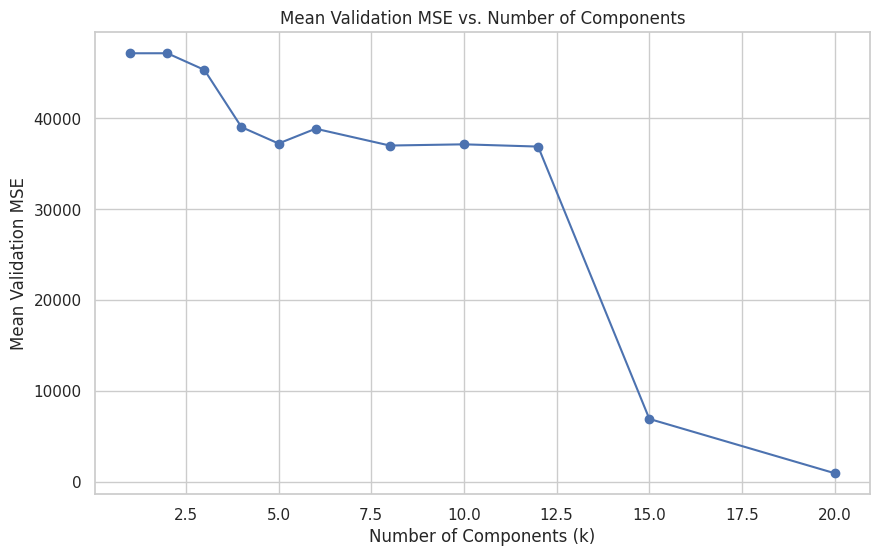

The best k is 20.


In [ ]:
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_validate
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import make_scorer, mean_squared_error

# Define the set of k values
k_values = [1, 2, 3, 4, 5, 6, 8, 10, 12, 15, 20]
mean_mse_values = []

# For each k, fit PCA and perform 10-fold cross validation for a linear regression model
for k in k_values:
    # Fit and transform using PCA
    pca = PCA(n_components=k)
    X_train_pca = pca.fit_transform(X_train_std)

    # Perform 10-fold cross validation
    scores = cross_validate(LinearRegression(), X_train_pca, y_train, cv=10,
                            scoring=make_scorer(mean_squared_error, greater_is_better=False))

    mean_mse_values.append(-scores['test_score'].mean())

# Plot the mean validation MSE for each k
plt.figure(figsize=(10, 6))
plt.plot(k_values, mean_mse_values, marker='o', linestyle='-')
plt.xlabel('Number of Components (k)')
plt.ylabel('Mean Validation MSE')
plt.title('Mean Validation MSE vs. Number of Components')
plt.grid(True)
plt.show()

best_k = k_values[np.argmin(mean_mse_values)]
print(f"The best k is {best_k}.")

PCR train R^2: 0.9792
PCR test R^2: 0.9792


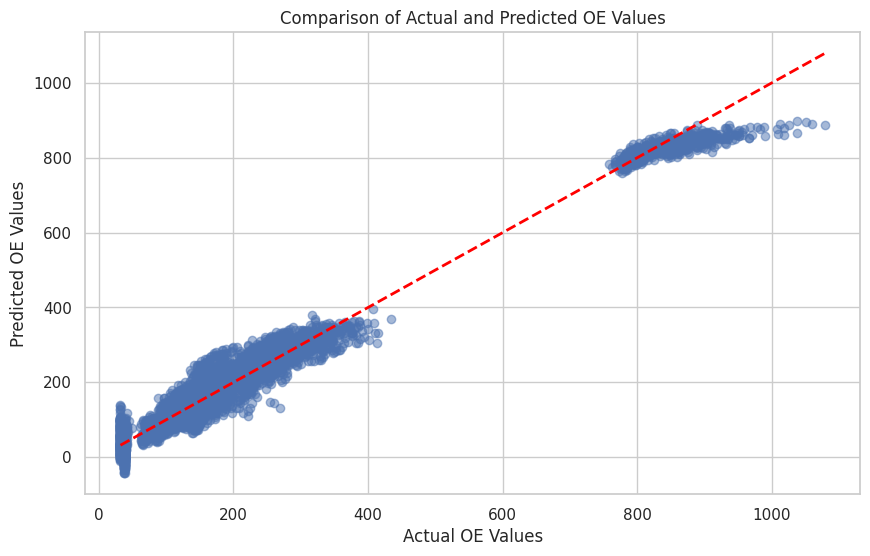

In [ ]:
# Fit the PCA transformation on the standardized X_train with n_components equal to the best k
pca_best = PCA(n_components=best_k)
X_train_pca_best = pca_best.fit_transform(X_train_std)
X_test_pca_best = pca_best.transform(X_test_std)

# Fit a linear regression model to the PCA-transformed components
linreg_pcr = LinearRegression()
linreg_pcr.fit(X_train_pca_best, y_train)

# Predict OE values on the PCA-transformed test data
y_pred_pcr = linreg_pcr.predict(X_test_pca_best)

pcr_train_r2 = linreg_pcr.score(X_train_pca_best, y_train)
pcr_test_r2 = linreg_pcr.score(X_test_pca_best, y_test)
print(f"PCR train R^2: {pcr_train_r2:.4f}")
print(f"PCR test R^2: {pcr_test_r2:.4f}")

# Plotting Actual vs Predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_pcr, alpha=0.5)
plt.xlabel('Actual OE Values')
plt.ylabel('Predicted OE Values')
plt.title('Comparison of Actual and Predicted OE Values')

# Plotting a reference line for perfect predictions (y=x)
plt.plot(np.unique(y_test), np.unique(y_test), color='red', linestyle='--', linewidth=2)

plt.show()

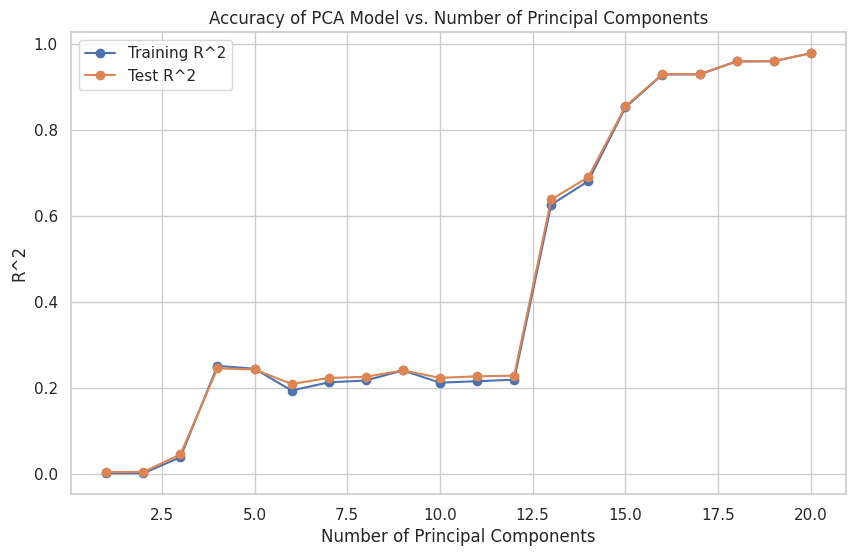

In [ ]:

n_components_range = range(1, best_k + 1)
# Initialize lists to store R^2 values
train_r2_values = []
test_r2_values = []

# Loop through different numbers of components and calculate R^2 for each
for n_components in n_components_range:
    # Fit PCA transformation
    pca = PCA(n_components=n_components)
    X_train_pca = pca.fit_transform(X_train_std)
    X_test_pca = pca.transform(X_test_std)

    # Fit linear regression model to PCA-transformed data
    linreg_pcr = LinearRegression()
    linreg_pcr.fit(X_train_pca, y_train)

    # Calculate R^2 for training set
    train_r2 = linreg_pcr.score(X_train_pca, y_train)

    # Calculate R^2 for test set
    test_r2 = linreg_pcr.score(X_test_pca, y_test)

    # Append R^2 values to the lists
    train_r2_values.append(train_r2)
    test_r2_values.append(test_r2)

# Create the line plot
plt.figure(figsize=(10, 6))
plt.plot(n_components_range, train_r2_values, marker='o', linestyle='-', label='Training R^2')
plt.plot(n_components_range, test_r2_values, marker='o', linestyle='-', label='Test R^2')
plt.xlabel('Number of Principal Components')
plt.ylabel('R^2')
plt.title('Accuracy of PCA Model vs. Number of Principal Components')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
mse_pca = mean_squared_error(y_test, y_pred_pcr)
rmse_pca = mean_squared_error(y_test, y_pred_pcr, squared=False)

In [ ]:
model_comparison = add_model_results(model_comparison, 'PCA Linear Regression', mse_pca, rmse_pca, pcr_test_r2)
model_comparison

,Model,MSE,RMSE,R2
0,Polynomial Regression with Lasso,302.581275,17.394863,0.993755
1,Linear Regression,380.887786,19.516347,0.992138
2,Linear Regression with Preprocessing,380.883383,19.516234,0.992138
3,PCA Linear Regression,1009.804470,31.777421,0.979157


In [ ]:
# Standardize the data
scaler = StandardScaler()
X_standardized = scaler.fit_transform(X_train)
# Apply PCA with 2 components
pca = PCA(n_components=2)
X_transformed = pca.fit_transform(X_standardized)
X_transformed[:5]

array([[ 2.68475536, -0.99357838],
       [ 3.54964235,  0.19787982],
       [-2.92647   ,  3.08599566],
       [-4.03737985, -0.03485804],
       [ 0.85049089,  2.02795328]])

In [ ]:
# Create a Decision Tree regression model
dt_model = DecisionTreeRegressor(random_state=42)

# Train the model on the training data
dt_model.fit(X_train, y_train)

# Make predictions on the test data
y_pred_dt = dt_model.predict(X_test)

# Evaluate the model's performance (e.g., using Mean Squared Error and R^2)
mse_dt = mean_squared_error(y_test, y_pred_dt)
r2_dt = r2_score(y_test, y_pred_dt)
rmse_dt = np.sqrt(mse_dt)
print(f"Mean Squared Error: {mse_dt:.2f}")
print(f"R^2 Score: {r2_dt:.2f}")

Mean Squared Error: 164.73
R^2 Score: 1.00


In [ ]:
model_comparison = add_model_results(model_comparison, 'Decision Tree Regression', mse_dt, rmse_dt, r2_dt)
model_comparison

,Model,MSE,RMSE,R2
0,Polynomial Regression with Lasso,302.581275,17.394863,0.993755
1,Linear Regression,380.887786,19.516347,0.992138
2,Linear Regression with Preprocessing,380.883383,19.516234,0.992138
3,PCA Linear Regression,1009.804470,31.777421,0.979157
4,Decision Tree Regression,164.727118,12.834606,0.996600


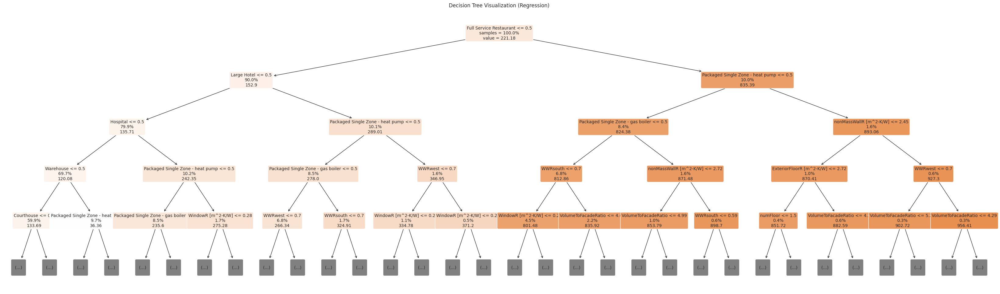

In [ ]:
from sklearn.tree import DecisionTreeRegressor, plot_tree

# Create a Decision Tree regression model
dt_model = DecisionTreeRegressor(random_state=42)

# Train the model on the training data
dt_model.fit(X_train, y_train)

# Convert the index of X to a list of strings for feature_names
feature_names = X.columns.tolist()

# Set parameters for improved readability
plt.figure(figsize=(42, 12))  # Adjust the figure size
plot_tree(
    dt_model,
    filled=True,
    feature_names=feature_names,
    fontsize=10,  # Adjust font size for text
    max_depth=4,  # Limit the tree depth for better visualization
    precision=2,  # Limit decimal precision for values
    label="root",  # Set the label for the root node
    proportion=True,  # Show proportions in leaf nodes
    impurity=False,  # Do not show impurity
    rounded=True,  # Use rounded boxes for nodes
)
plt.title("Decision Tree Visualization (Regression)")
plt.show()

In [ ]:
y_pred_poly_flat = y_pred_poly.ravel() if hasattr(y_pred_poly, 'values') else np.array(y_pred_poly).flatten()
y_pred_lin_flat = y_pred_lin.ravel() if hasattr(y_pred_lin, 'values') else np.array(y_pred_lin).flatten()
y_pred_lin2_flat = y_pred_lin2.ravel() if hasattr(y_pred_lin2, 'values') else np.array(y_pred_lin2).flatten()
y_pred_pcr_flat = y_pred_pcr.ravel() if hasattr(y_pred_pcr, 'values') else np.array(y_pred_pcr).flatten()
y_pred_dt_flat = y_pred_dt.ravel() if hasattr(y_pred_dt, 'values') else np.array(y_pred_dt).flatten()
y_test_flat = y_test.values.ravel()

In [ ]:
comparison_data = {
    'Actual': y_test_flat,
    'Polynomial Regression with Lasso': y_pred_poly_flat,
    'Linear Regression': y_pred_lin_flat,
    'Linear Regression with Preprocessing': y_pred_lin2_flat,
    'PCA Linear Regression': y_pred_pcr_flat,
    'Decision Tree Regression': y_pred_dt_flat
}

In [ ]:
comparison_data

{'Actual': array([881.089132, 147.693614, 295.108297, ..., 208.48666 , 137.805741,
        328.741429]),
 'Polynomial Regression with Lasso': array([879.11021168, 149.0662746 , 277.39578199, ..., 217.29054089,
        141.95854913, 297.30026114]),
 'Linear Regression': array([859.33146813, 148.66217426, 278.21382358, ..., 209.94903733,
        140.65784501, 297.25504378]),
 'Linear Regression with Preprocessing': array([859.33076279, 148.65205185, 278.22334091, ..., 209.95869247,
        140.67695419, 297.2575206 ]),
 'PCA Linear Regression': array([844.53337242, 150.28458055, 244.40758574, ..., 197.85026316,
        154.75294608, 312.73873796]),
 'Decision Tree Regression': array([854.550388, 140.909934, 303.322666, ..., 209.682368, 136.493421,
        319.419918])}

In [ ]:
comparison_df = pd.DataFrame(comparison_data)
comparison_df

,Actual,Polynomial Regression with Lasso,Linear Regression,Linear Regression with Preprocessing,PCA Linear Regression,Decision Tree Regression
0,881.089132,879.110212,859.331468,859.330763,844.533372,854.550388
1,147.693614,149.066275,148.662174,148.652052,150.284581,140.909934
2,295.108297,277.395782,278.213824,278.223341,244.407586,303.322666
3,297.975901,284.199560,285.438306,285.445021,290.587820,299.626000
4,170.019497,167.322717,174.706197,174.701857,151.749508,165.248074
...,...,...,...,...,...,...
6495,326.458920,300.418473,302.560219,302.565138,311.217675,319.266168
6496,858.693898,845.122912,852.525398,852.529005,820.636123,856.541869
6497,208.486660,217.290541,209.949037,209.958692,197.850263,209.682368
6498,137.805741,141.958549,140.657845,140.676954,154.752946,136.493421


Checking model performances so far to compare!

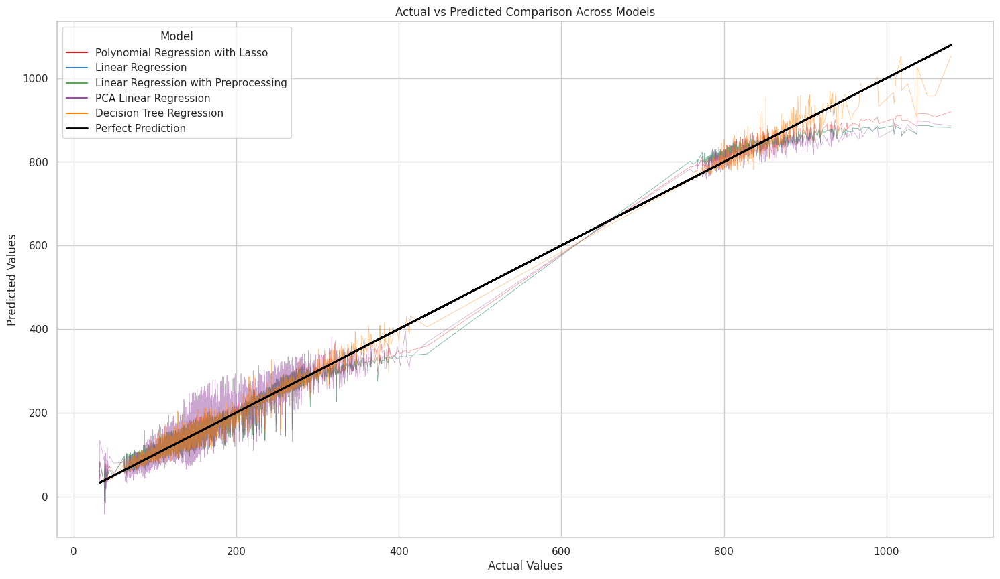

In [ ]:
comparison_melted = comparison_df.melt('Actual', var_name='Model', value_name='Predicted')

plt.figure(figsize=(18, 10))
sns.lineplot(x='Actual', y='Predicted', hue='Model', data=comparison_melted, alpha=0.5, palette='Set1', linewidth=0.5)

# Add the actual values line with a darker color and alpha set to 1 for visibility
plt.plot(comparison_df['Actual'], comparison_df['Actual'], label='Perfect Prediction', color='black', lw=2, alpha=1)

plt.title('Actual vs Predicted Comparison Across Models')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend(title='Model')
plt.show()

<hr>
<hr>
<h1>Random Forest Regression<h1>
<hr>
<hr>

In [ ]:
rf = RandomForestRegressor(n_estimators=100, oob_score=True, random_state=42)

In [ ]:
rf.fit(X_train, y_train.values.ravel())

y_pred_rf = rf.predict(X_test)

In [ ]:
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = rf.score(X_test, y_test)
oob_score = rf.oob_score_

mse_rf, oob_score

(80.28851734132633, 0.9983000796106327)

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

rf_scaled = RandomForestRegressor(n_estimators=100, oob_score=True, random_state=42)
rf_scaled.fit(X_train_scaled, y_train.values.ravel())

y_pred_rf_scaled = rf_scaled.predict(X_test_scaled)

mse_rf_scaled = mean_squared_error(y_test, y_pred_rf_scaled)

oob_score_scaled = rf_scaled.oob_score_

{
    "MSE": mse_rf,
    "MSE_scaled": mse_rf_scaled,
    "OOB_score": oob_score,
    "OOB_score_scaled": oob_score_scaled
}

{'MSE': 80.28851734132633,
 'MSE_scaled': 80.28423139578837,
 'OOB_score': 0.9983000796106327,
 'OOB_score_scaled': 0.998299588599214}

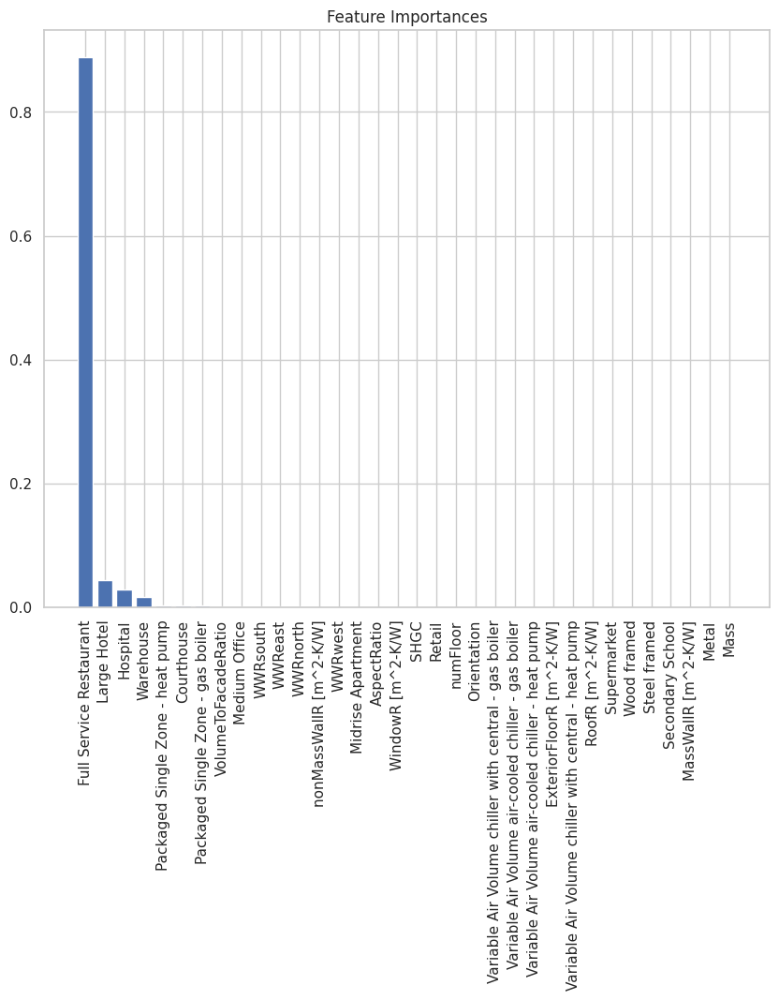

In [ ]:
feature_importances = rf.feature_importances_
indices = np.argsort(feature_importances)[::-1]

names = [X_train.columns[i] for i in indices]

plt.figure(figsize=(10, 8))
plt.title("Feature Importances")
plt.bar(range(X_train.shape[1]), feature_importances[indices])
plt.xticks(range(X_train.shape[1]), names, rotation=90)
plt.show()

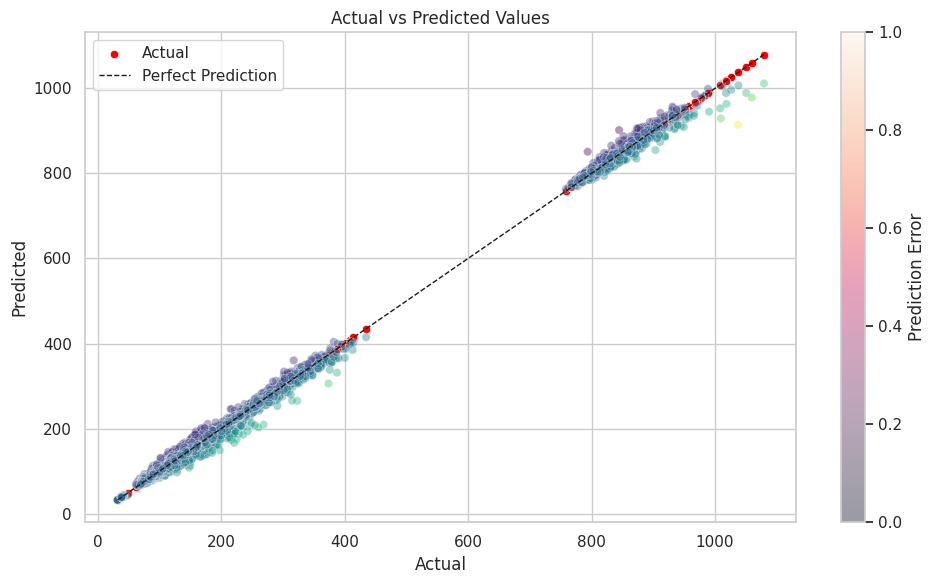

In [ ]:
errors = y_test.values.ravel() - y_pred_rf

plt.figure(figsize=(10, 6))
scatter = sns.scatterplot(x=y_test.values.ravel(), y=y_test.values.ravel(), alpha=1, color='red', label='Actual')
scatter = sns.scatterplot(x=y_test.values.ravel(), y=y_pred_rf, alpha=0.4, hue=errors, palette='viridis', legend=False)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, label='Perfect Prediction')

plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted Values')
plt.legend()
plt.tight_layout()
plt.colorbar(scatter.collections[1], label='Prediction Error')
plt.show()

Here is the scatter plot illustrating the relationship between the true values of the response variable and the values predicted by the Random Forest Regressor. Each point represents a different observation from the test set.

The diagonal dashed line represents the line of perfect predictions where the true values are exactly equal to the predicted values. Ideally, all points should fall on or very close to this line, indicating accurate predictions.

The points are very tightly clustered around the line, which visually confirms the high R-squared value we saw earlier. This suggests that the model's predictions are very close to the actual values for most of the test data. However, it's always good to remain cautious of overfitting and validate the model further with cross-validation if needed.

In [ ]:
program_columns = [
    "Courthouse",
    "Full Service Restaurant",
    "Hospital",
    "Large Hotel",
    "Medium Office",
    "Midrise Apartment",
    "Retail",
    "Secondary School",
    "Supermarket",
    "Warehouse",
]

wall_columns = [
    "Mass",
    "Steel framed",
    "Wood framed",
    "Metal",
]

equip_columns = [
    "Packaged Single Zone - gas boiler",
    "Packaged Single Zone - heat pump",
    "Variable Air Volume air-cooled chiller - gas boiler",
    "Variable Air Volume air-cooled chiller - heat pump",
    "Variable Air Volume chiller with central - gas boiler",
    "Variable Air Volume chiller with central - heat pump",
]

In [ ]:
rf_scaled = RandomForestRegressor(n_estimators=100, oob_score=True, random_state=42)
rf_scaled.fit(X_train_scaled, y_train.values.ravel())

y_pred_rf_scaled = rf_scaled.predict(X_test_scaled)

mse_rf_scaled = mean_squared_error(y_test, y_pred_rf_scaled)

oob_score_scaled = rf_scaled.oob_score_


mse_rf_scaled, oob_score_scaled

(80.28423139578837, 0.998299588599214)

In [ ]:
from math import sqrt
rmse_scaled_rf = sqrt(mse_rf_scaled)

param_grid_small = {
    'n_estimators': [10, 50],
    'max_depth': [None, 10],
    'min_samples_split': [2, 4],
    'min_samples_leaf': [1, 2],
    'max_features': ['auto', 'sqrt']
}

rf = RandomForestRegressor(random_state=42)

rf_grid_search = GridSearchCV(estimator=rf, param_grid=param_grid_small,
                              cv=2, verbose=2, n_jobs=-1)

rf_grid_search.fit(X_train_scaled, y_train.values.ravel())

best_params_grid = rf_grid_search.best_params_
best_params_grid

Fitting 2 folds for each of 32 candidates, totalling 64 fits


{'max_depth': None,
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 50}

In [ ]:
final_rf = RandomForestRegressor(
    n_estimators=50,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=2,
    max_features='auto',
    oob_score=True,
    random_state=42
)

final_rf.fit(X_train_scaled, y_train.values.ravel())

final_y_pred_rf = final_rf.predict(X_test_scaled)

final_mse_rf = mean_squared_error(y_test, final_y_pred_rf)

final_oob_score_rf = final_rf.oob_score_

final_mse_rf, final_oob_score_rf

(80.5747467750846, 0.9982450345346688)

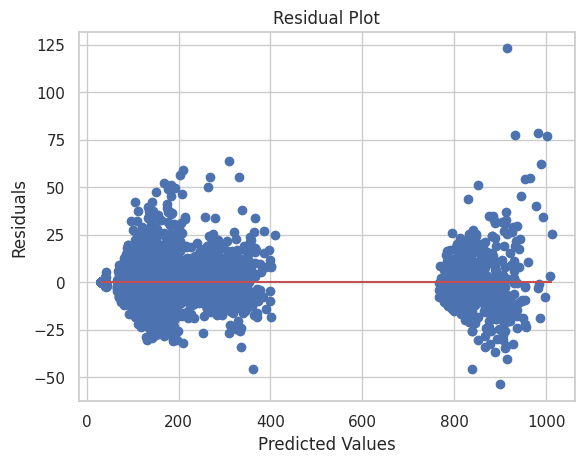

In [ ]:
y_test_values = y_test.values.ravel() #to convert to 1-D array

residuals = y_test_values - final_y_pred_rf

plt.scatter(final_y_pred_rf, residuals)
plt.hlines(y=0, xmin=final_y_pred_rf.min(), xmax=final_y_pred_rf.max(), colors='r')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

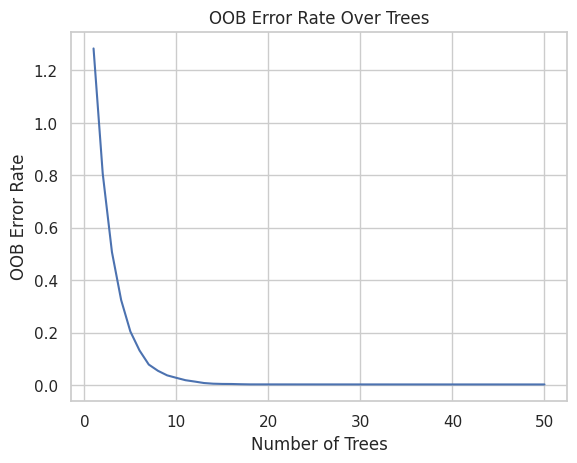

In [ ]:
oob_scores = []

rf = RandomForestRegressor(n_estimators=1, warm_start=True, oob_score=True,
                           max_features='auto', random_state=42)

for n_trees in range(1, 51):
    rf.set_params(n_estimators=n_trees)
    rf.fit(X_train_scaled, y_train.values.ravel())

    oob_scores.append(rf.oob_score_)

oob_errors = [1 - oob for oob in oob_scores]

plt.plot(range(1, 51), oob_errors)
plt.xlabel('Number of Trees')
plt.ylabel('OOB Error Rate')
plt.title('OOB Error Rate Over Trees')
plt.show()

In [ ]:
model_metrics = {
    'Model': [],
    'MSE': [],
    'RMSE': [],
    'OOB Score': [],
}

In [ ]:
model_metrics['Model'].append('Random Forest pre_tuning')
model_metrics['MSE'].append(mse_rf_scaled)
model_metrics['RMSE'].append(rmse_scaled_rf)
model_metrics['OOB Score'].append(oob_score_scaled)

In [ ]:
final_rmse_scaled_rf = sqrt(final_mse_rf)

model_metrics['Model'].append('Random Forest post-tuning')
model_metrics['MSE'].append(final_mse_rf)
model_metrics['RMSE'].append(final_rmse_scaled_rf)
model_metrics['OOB Score'].append(final_oob_score_rf)

In [ ]:
model_metrics

{'Model': ['Random Forest pre_tuning', 'Random Forest post-tuning'],
 'MSE': [80.28423139578837, 80.5747467750846],
 'RMSE': [8.960146840079595, 8.9763437308898],
 'OOB Score': [0.998299588599214, 0.9982450345346688]}

In [ ]:
metrics_df = pd.DataFrame(model_metrics)
metrics_df

,Model,MSE,RMSE,OOB Score
0,Random Forest pre_tuning,80.284231,8.960147,0.998300
1,Random Forest post-tuning,80.574747,8.976344,0.998245


In [ ]:
final_r2_rf = final_rf.score(X_test_scaled, y_test)
rmse_rf = sqrt(mse_rf)
final_rmse_rf = sqrt(final_mse_rf)

In [ ]:
model_comparison = add_model_results(model_comparison, 'Random Forest (Pre-tuning)', mse_rf, rmse_rf, r2_rf)

In [ ]:
model_comparison = add_model_results(model_comparison, 'Random Forest (Post-tuning)', final_mse_rf, final_rmse_rf, final_r2_rf)

In [ ]:
model_comparison

,Model,MSE,RMSE,R2
0,Polynomial Regression with Lasso,302.581275,17.394863,0.993755
1,Linear Regression,380.887786,19.516347,0.992138
2,Linear Regression with Preprocessing,380.883383,19.516234,0.992138
3,PCA Linear Regression,1009.804470,31.777421,0.979157
4,Decision Tree Regression,164.727118,12.834606,0.996600
5,Random Forest (Pre-tuning),80.288517,8.960386,0.998343
6,Random Forest (Post-tuning),80.574747,8.976344,0.998337


In [ ]:
comparison_df['Random Forest (Pre-tuning)'] = y_pred_rf
comparison_df['Random Forest (Post-tuning)'] = final_y_pred_rf

In [ ]:
comparison_melted = comparison_df.melt('Actual', var_name='Model', value_name='Predicted')

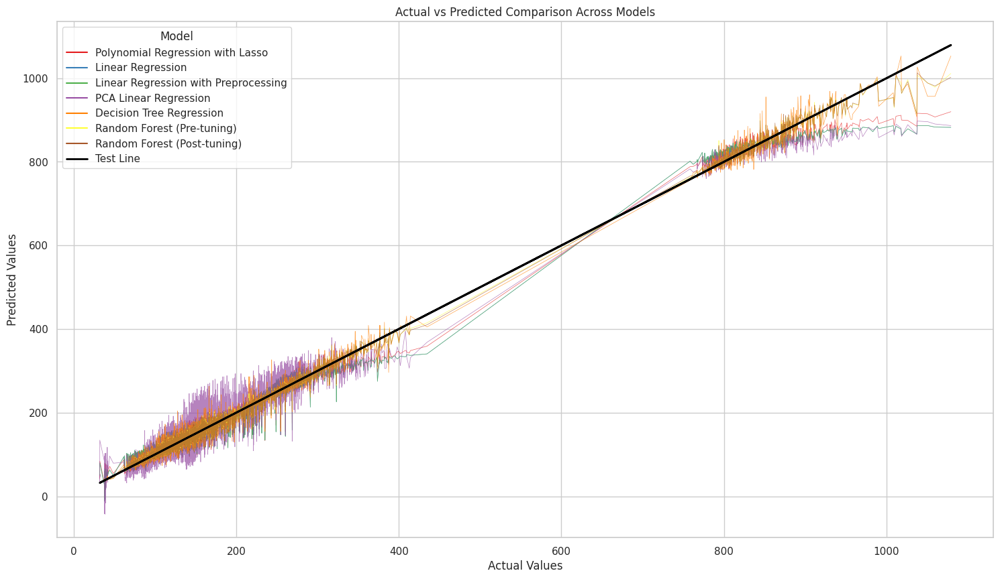

In [ ]:
plt.figure(figsize=(18, 10))
sns.lineplot(x='Actual', y='Predicted', hue='Model', data=comparison_melted, alpha=0.7, palette='Set1', linewidth=0.5)
plt.plot(comparison_df['Actual'], comparison_df['Actual'], label='Test Line', color='black', lw=2, alpha=1)
plt.title('Actual vs Predicted Comparison Across Models')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend(title='Model')
plt.show()

Interpretations:

The changes in MSE and RMSE are very small, indicating that the hyperparameter tuning did not lead to a significant improvement in the model's ability to minimize the average error in predictions.
The OOB score also shows a very minor decrease, implying that the model's generalization on unseen data is roughly the same before and after tuning.
The lack of significant improvement could be due to several reasons, such as the model already performing near its best with the given data and features, or the hyperparameter space explored during tuning was not extensive enough to find a better set of parameters.
Given that the scores are very close to 1, this could also indicate that the model is already performing very well, and there might be little room for improvement, at least with the hyperparameters that were tuned.

<hr>
<hr>
<h1>Extreme Gradient Boosting<h1>
<hr>
<hr>

In [ ]:
continuous_columns = [col for col in pred.columns if col not in (program_columns + wall_columns + equip_columns)]

scaler = StandardScaler()

pred[continuous_columns] = scaler.fit_transform(pred[continuous_columns])

pred.head()

,Orientation,nonMassWallR [m^2-K/W],MassWallR [m^2-K/W],RoofR [m^2-K/W],ExteriorFloorR [m^2-K/W],WWRnorth,WWRwest,WWRsouth,WWReast,SHGC,...,Medium Office,Midrise Apartment,Retail,Secondary School,Supermarket,Warehouse,Mass,Steel framed,Wood framed,Metal
0,1.612736,0.336723,-0.394568,1.517794,0.703114,-1.081111,-1.532441,0.240643,-1.381225,0.414473,...,0,0,1,0,0,0,0,0,0,1
1,-0.804851,0.812136,-0.394568,2.825094,1.397133,-0.741229,-1.041839,-0.891804,-0.136095,0.991374,...,0,0,1,0,0,0,0,0,0,1
2,0.020199,-0.118314,-0.394568,-0.254186,-0.397160,-0.514641,-0.551238,0.165147,-1.456687,0.702923,...,0,0,0,0,0,0,1,0,0,0
3,1.718265,-1.619260,2.098007,-0.254186,-0.594646,-0.363582,-0.513500,-0.552070,-0.098364,0.702923,...,0,1,0,0,0,0,1,0,0,0
4,1.315334,-0.247355,-0.394568,-0.948108,0.308144,1.449123,1.448905,1.448588,1.448616,-1.172006,...,1,0,0,0,0,0,0,1,0,0


In [ ]:
#XGBoosting can't have special characters in feature names... remove them
pred.columns = [col.replace('[', '').replace(']', '').replace('<', 'lt').replace('-', '').replace(' ', '_') for col in pred.columns]

pred.columns.tolist()

['Orientation',
 'nonMassWallR_m^2K/W',
 'MassWallR_m^2K/W',
 'RoofR_m^2K/W',
 'ExteriorFloorR_m^2K/W',
 'WWRnorth',
 'WWRwest',
 'WWRsouth',
 'WWReast',
 'SHGC',
 'WindowR_m^2K/W',
 'numFloor',
 'AspectRatio',
 'VolumeToFacadeRatio',
 'Packaged_Single_Zone__gas_boiler',
 'Packaged_Single_Zone__heat_pump',
 'Variable_Air_Volume_aircooled_chiller__gas_boiler',
 'Variable_Air_Volume_aircooled_chiller__heat_pump',
 'Variable_Air_Volume_chiller_with_central__gas_boiler',
 'Variable_Air_Volume_chiller_with_central__heat_pump',
 'Courthouse',
 'Full_Service_Restaurant',
 'Hospital',
 'Large_Hotel',
 'Medium_Office',
 'Midrise_Apartment',
 'Retail',
 'Secondary_School',
 'Supermarket',
 'Warehouse',
 'Mass',
 'Steel_framed',
 'Wood_framed',
 'Metal']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(pred, resp.values.ravel(), test_size=0.2, random_state=42)

xgb_model = XGBRegressor(objective='reg:squarederror', random_state=42)

xgb_model.fit(X_train, y_train)

y_pred_xgb = xgb_model.predict(X_test)

first_mse_xgb = mean_squared_error(y_test, y_pred_xgb)
first_rmse_xgb = mean_squared_error(y_test, y_pred_xgb, squared=False)

first_mse_xgb, first_rmse_xgb

(63.26026731316064, 7.953632334547571)

In [ ]:
cv_scores = cross_val_score(xgb_model, pred, resp.values.ravel(), scoring='neg_mean_squared_error', cv=5)
cv_rmse_scores = np.sqrt(-cv_scores)

#Calculate the mean and standard deviation of the cross-validated RMSE scores
cv_rmse_mean = cv_rmse_scores.mean()
cv_rmse_std = cv_rmse_scores.std()

cv_rmse_mean, cv_rmse_std

(7.822520234384726, 0.20010231904277284)

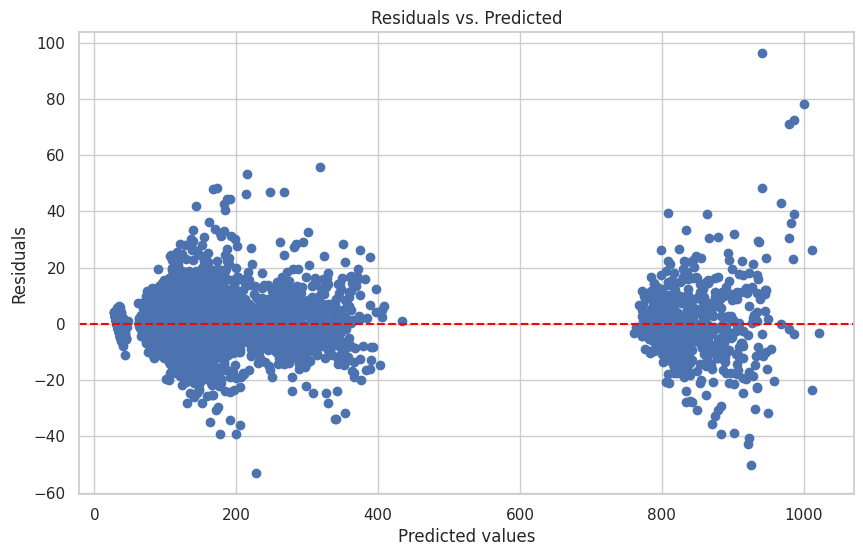

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_xgb, (y_test - y_pred_xgb))
plt.title('Residuals vs. Predicted')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.show()

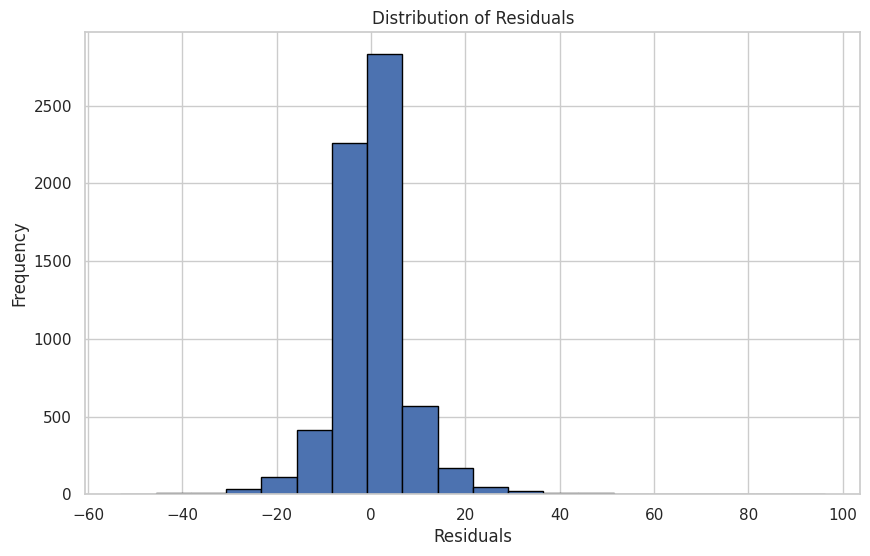

In [ ]:
residuals = y_test - y_pred_xgb
plt.figure(figsize=(10, 6))
plt.hist(residuals, bins=20, edgecolor='black')
plt.title('Distribution of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

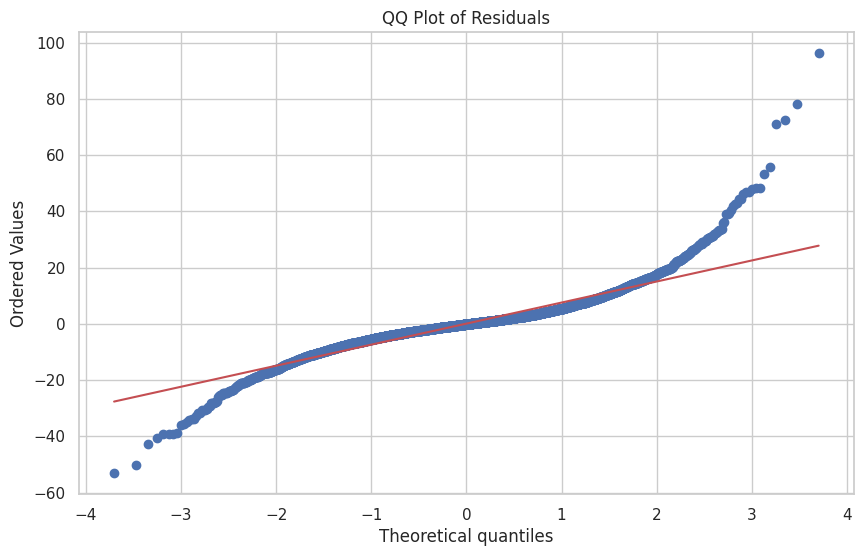

In [ ]:
import scipy.stats as stats

plt.figure(figsize=(10, 6))
stats.probplot(residuals, dist="norm", plot=plt)
plt.title('QQ Plot of Residuals')
plt.show()

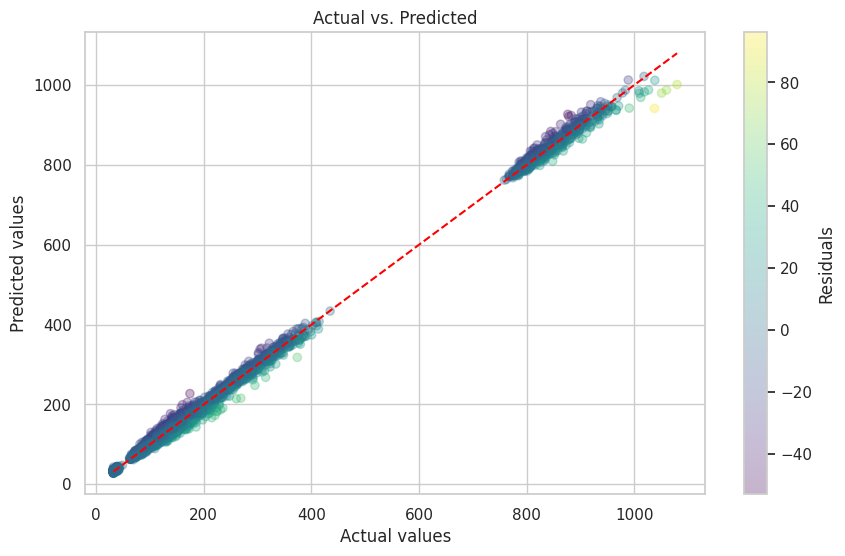

In [ ]:
plt.figure(figsize=(10, 6))
scatter = plt.scatter(y_test, y_pred_xgb, alpha=0.3, c=residuals, cmap='viridis')

cbar = plt.colorbar(scatter)
cbar.set_label('Residuals')

plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')

plt.title('Actual vs. Predicted')
plt.xlabel('Actual values')
plt.ylabel('Predicted values')

plt.show()

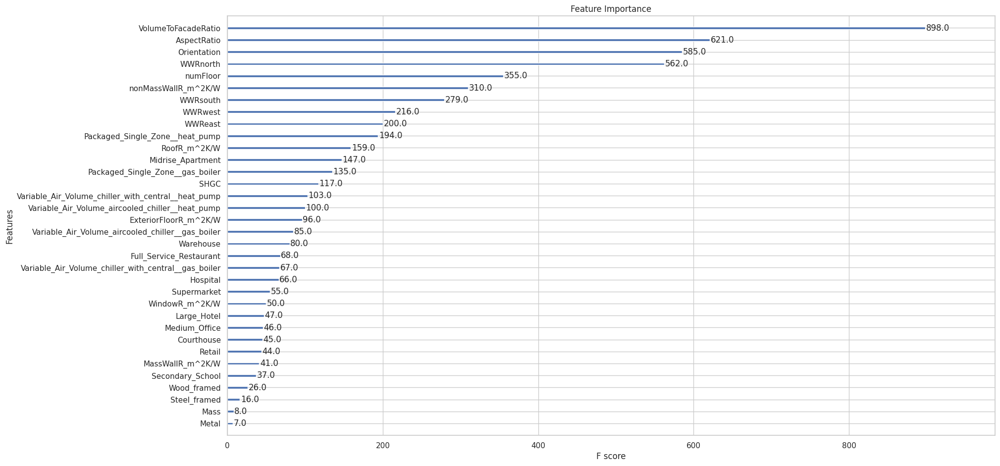

In [ ]:
fig, ax = plt.subplots(figsize=(20, 11))

xgb.plot_importance(xgb_model, ax=ax)

plt.title('Feature Importance')
plt.show()

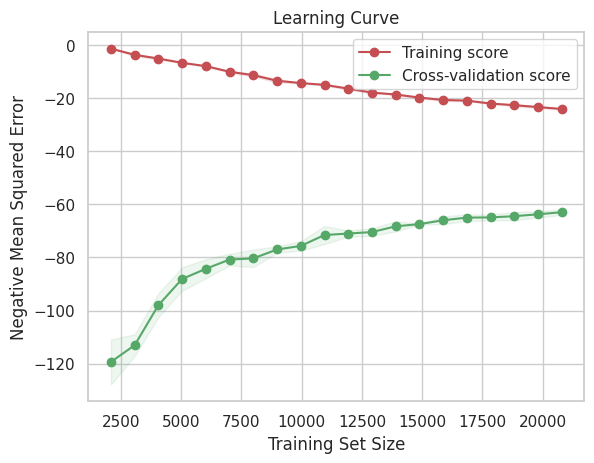

In [ ]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(
    xgb_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error',
    n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 20))

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)

test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, color="r", alpha=0.1)
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, color="g", alpha=0.1)
plt.plot(train_sizes, train_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_mean, 'o-', color="g", label="Cross-validation score")

plt.title("Learning Curve")
plt.xlabel("Training Set Size")
plt.ylabel("Negative Mean Squared Error")
plt.legend(loc="best")
plt.show()

In [ ]:
lc_train_mse = -train_mean[-1]
lc_test_mse = -test_mean[-1]

lc_train_rmse = np.sqrt(lc_train_mse)
lc_test_rmse = np.sqrt(lc_test_mse)

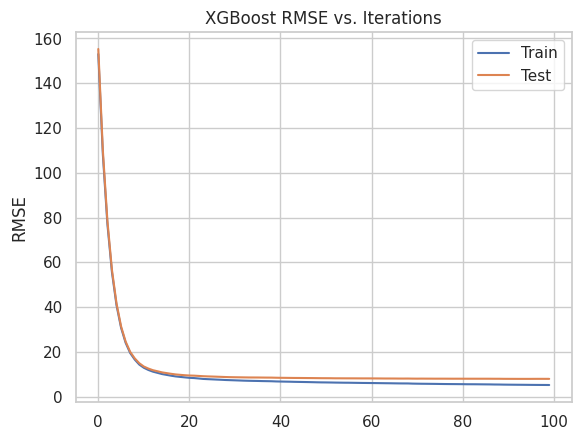

In [ ]:
eval_set = [(X_train, y_train), (X_test, y_test)]

xgb_model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42, n_estimators=100)
xgb_model.fit(X_train, y_train, eval_metric="rmse", eval_set=eval_set, verbose=False)

results = xgb_model.evals_result()

epochs = len(results['validation_0']['rmse'])
x_axis = range(0, epochs)

fig, ax = plt.subplots()
ax.plot(x_axis, results['validation_0']['rmse'], label='Train')
ax.plot(x_axis, results['validation_1']['rmse'], label='Test')
ax.legend()
plt.ylabel('RMSE')
plt.title('XGBoost RMSE vs. Iterations')
plt.show()

In [ ]:
train_rmse_pre_tuned = results['validation_0']['rmse'][-1]
test_rmse_pre_tuned = results['validation_1']['rmse'][-1]

train_mse_pre_tuned = train_rmse_pre_tuned ** 2
test_mse_pre_tuned = test_rmse_pre_tuned ** 2

In [ ]:
model_comparison = add_model_results(
    model_comparison,
    'XGBoost (Pre-tuned)',
    test_mse_pre_tuned,
    test_rmse_pre_tuned,
    xgb_model.score(X_test, y_test)
)

In [ ]:
comparison_df['XGBoost (Pre-tuned)'] = y_pred_xgb
comparison_melted = comparison_df.melt('Actual', var_name='Model', value_name='Predicted')

In [ ]:
model_comparison

,Model,MSE,RMSE,R2
0,Polynomial Regression with Lasso,302.581275,17.394863,0.993755
1,Linear Regression,380.887786,19.516347,0.992138
2,Linear Regression with Preprocessing,380.883383,19.516234,0.992138
3,PCA Linear Regression,1009.804470,31.777421,0.979157
4,Decision Tree Regression,164.727118,12.834606,0.996600
5,Random Forest (Pre-tuning),80.288517,8.960386,0.998343
6,Random Forest (Post-tuning),80.574747,8.976344,0.998337
7,XGBoost (Pre-tuned),63.260267,7.953632,0.998694


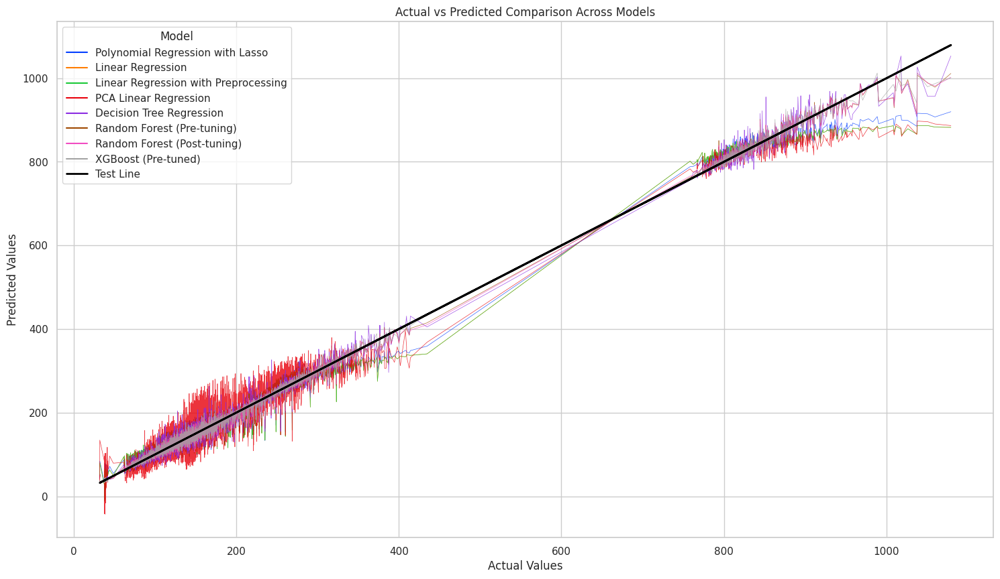

In [ ]:
plt.figure(figsize=(18, 10))
sns.lineplot(x='Actual', y='Predicted', hue='Model', data=comparison_melted, alpha=0.8, palette='bright', linewidth=0.5)
plt.plot(comparison_df['Actual'], comparison_df['Actual'], label='Test Line', color='black', lw=2, alpha=1)
plt.title('Actual vs Predicted Comparison Across Models')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend(title='Model')
plt.show()

<hr>
<h2>Extreme Gradient Boosting ++ (Hyperparameter tuning + Feature Selection)</h2>
<hr>

In [ ]:
param_dist = {
    'n_estimators': randint(100, 500),
    'max_depth': randint(3, 10),
    'learning_rate': uniform(0.01, 0.2),
    'subsample': uniform(0.5, 0.5),
    'colsample_bytree': uniform(0.5, 0.5)
}

random_search = RandomizedSearchCV(
    estimator = xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_distributions = param_dist,
    n_iter = 10,
    cv = 5,
    scoring = 'neg_mean_squared_error',
    random_state = 42,
    n_jobs = -1
)

random_search.fit(X_train, y_train)

best_parameters = random_search.best_params_
best_rmse = np.sqrt(-random_search.best_score_)

print("Best Parameters:", best_parameters)
print("Best RMSE:", best_rmse)

Best Parameters: {'colsample_bytree': 0.8925879806965068, 'learning_rate': 0.04993475643167195, 'max_depth': 9, 'n_estimators': 343, 'subsample': 0.7962072844310213}
Best RMSE: 7.670419097924025


In [ ]:
best_mse = -random_search.best_score_
best_mse, best_rmse

(58.835329137797615, 7.670419097924025)

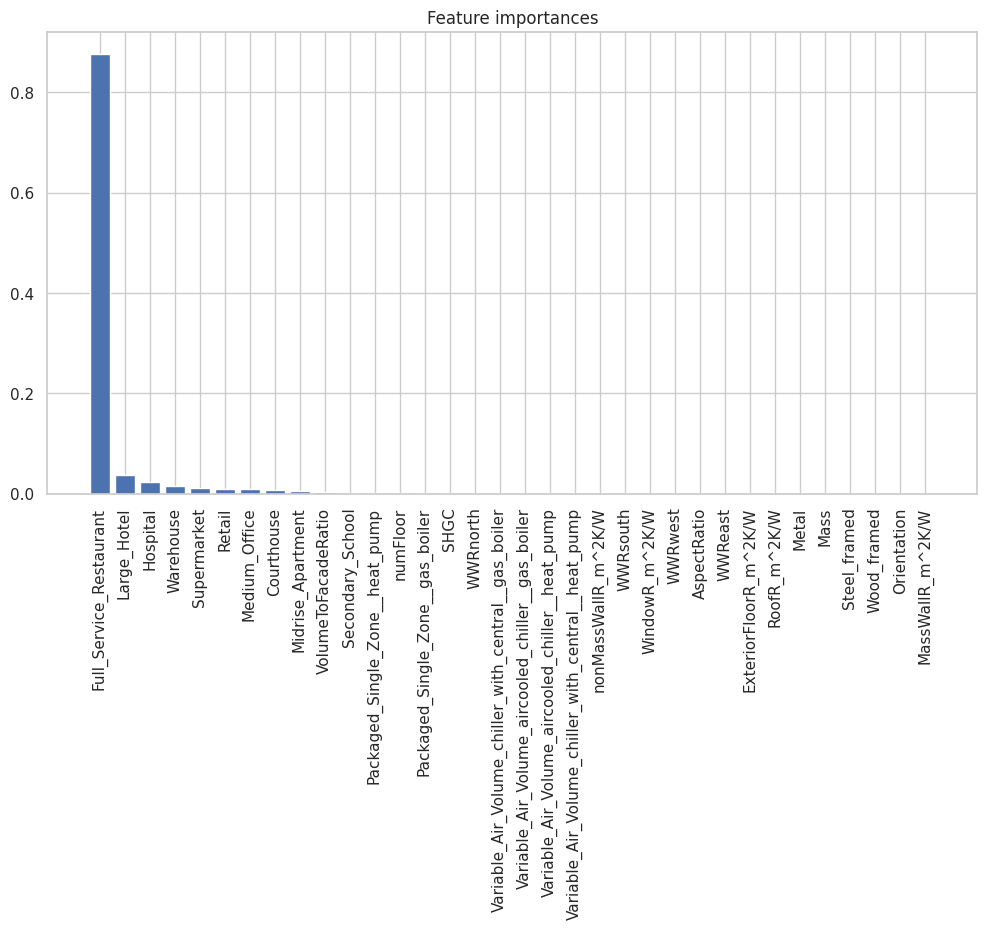

In [ ]:
best_model = random_search.best_estimator_

importances = best_model.feature_importances_

indices = np.argsort(importances)[::-1]
plt.figure(figsize=(12, 6))
plt.title("Feature importances")
plt.bar(range(X_train.shape[1]), importances[indices])
plt.xticks(range(X_train.shape[1]), X_train.columns[indices], rotation=90)
plt.show()

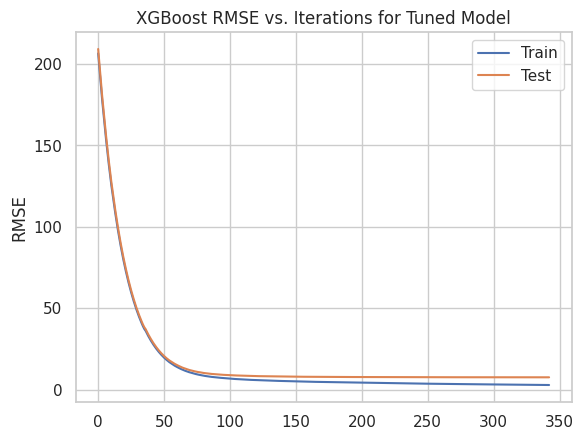

In [ ]:
tuned_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    colsample_bytree=best_parameters['colsample_bytree'],
    learning_rate=best_parameters['learning_rate'],
    max_depth=best_parameters['max_depth'],
    n_estimators=best_parameters['n_estimators'],
    subsample=best_parameters['subsample'],
    random_state=42
)

eval_set = [(X_train, y_train), (X_test, y_test)]
tuned_model.fit(X_train, y_train, eval_metric="rmse", eval_set=eval_set, verbose=False)

results = tuned_model.evals_result()

epochs = len(results['validation_0']['rmse'])
x_axis = range(0, epochs)

fig, ax = plt.subplots()
ax.plot(x_axis, results['validation_0']['rmse'], label='Train')
ax.plot(x_axis, results['validation_1']['rmse'], label='Test')
ax.legend()
plt.ylabel('RMSE')
plt.title('XGBoost RMSE vs. Iterations for Tuned Model')
plt.show()

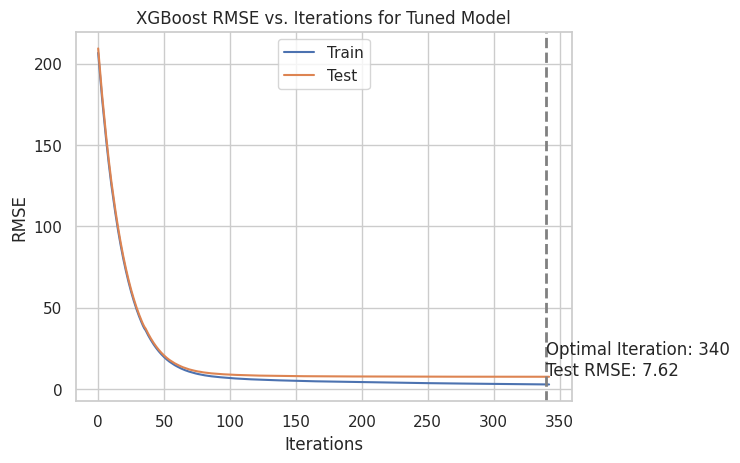

In [ ]:
epochs = len(results['validation_0']['rmse'])
x_axis = range(0, epochs)

optimal_iterations = np.argmin(results['validation_1']['rmse'])
optimal_rmse = np.min(results['validation_1']['rmse'])

fig, ax = plt.subplots()
ax.plot(x_axis, results['validation_0']['rmse'], label='Train')
ax.plot(x_axis, results['validation_1']['rmse'], label='Test')

ax.axvline(x=optimal_iterations, color='gray', lw=2, linestyle='--')
ax.annotate(f'Optimal Iteration: {optimal_iterations}\nTest RMSE: {optimal_rmse:.2f}',
             xy=(optimal_iterations, optimal_rmse), xycoords='data',
             xytext=(optimal_iterations, optimal_rmse + 1), textcoords='data',
             arrowprops=dict(arrowstyle="->", connectionstyle="arc3"),
             )

ax.legend()
plt.ylabel('RMSE')
plt.xlabel('Iterations')
plt.title('XGBoost RMSE vs. Iterations for Tuned Model')
plt.show()

In [ ]:
y_pred_xgb_tuned = tuned_model.predict(X_test)
r2_xgb_tuned = r2_score(y_test, y_pred_xgb_tuned)
mse_xgb_tuned = mean_squared_error(y_test, y_pred_xgb_tuned)
rmse_xgb_tuned = np.sqrt(mse_xgb_tuned)

In [ ]:
model_comparison = add_model_results(
    model_comparison,
    'XGBoost (Post-tuning)',
    mse_xgb_tuned,
    rmse_xgb_tuned,
    r2_xgb_tuned
)

In [ ]:
model_comparison

,Model,MSE,RMSE,R2
0,Polynomial Regression with Lasso,302.581275,17.394863,0.993755
1,Linear Regression,380.887786,19.516347,0.992138
2,Linear Regression with Preprocessing,380.883383,19.516234,0.992138
3,PCA Linear Regression,1009.804470,31.777421,0.979157
4,Decision Tree Regression,164.727118,12.834606,0.996600
5,Random Forest (Pre-tuning),80.288517,8.960386,0.998343
6,Random Forest (Post-tuning),80.574747,8.976344,0.998337
7,XGBoost (Pre-tuned),63.260267,7.953632,0.998694
8,XGBoost (Post-tuning),58.036042,7.618139,0.998802


In [ ]:
comparison_df['XGBoost (Post-tuning)'] = y_pred_xgb_tuned
comparison_melted = comparison_df.melt('Actual', var_name='Model', value_name='Predicted')

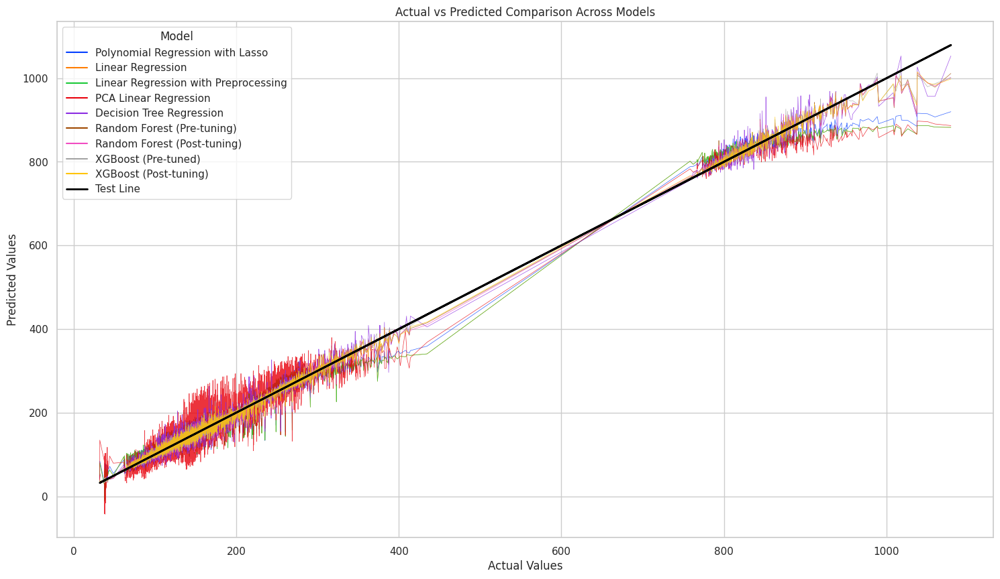

In [ ]:
plt.figure(figsize=(18, 10))
sns.lineplot(x='Actual', y='Predicted', hue='Model', data=comparison_melted, alpha=0.8, palette='bright', linewidth=0.5)
plt.plot(comparison_df['Actual'], comparison_df['Actual'], label='Test Line', color='black', lw=2, alpha=1)
plt.title('Actual vs Predicted Comparison Across Models')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend(title='Model')
plt.show()

Please refer to the plot prior to hyperparameter tuning.
After tuning, the RMSE starts much higher, but decreases more smoothly and continues improving across more iterations, marking the optimal iteration at 340 and test RMSE of 7.62. Further from this, the model does not improve, and may overfit if continued.

Summary Interpretations:

The hyperparameter tuning has improved the model's performance as indicated by a lower RMSE.
The training RMSE during the learning curve phase is significantly better than the initial model, showing that the model is capable of learning effectively.
The testing RMSE has not improved as much from the initial model to the learning curve testing phase, which could imply that the model might still be overfitting or that it has reached a performance plateau.
What is best?

The "Post-tuned Convergence" model has the lowest RMSE at 7.67, making it the best-performing model in terms of error minimization. This model is the most refined version you have and should be the preferred choice for making predictions.

In [ ]:
model_comparison

,Model,MSE,RMSE,R2
0,Polynomial Regression with Lasso,302.581275,17.394863,0.993755
1,Linear Regression,380.887786,19.516347,0.992138
2,Linear Regression with Preprocessing,380.883383,19.516234,0.992138
3,PCA Linear Regression,1009.804470,31.777421,0.979157
4,Decision Tree Regression,164.727118,12.834606,0.996600
5,Random Forest (Pre-tuning),80.288517,8.960386,0.998343
6,Random Forest (Post-tuning),80.574747,8.976344,0.998337
7,XGBoost (Pre-tuned),63.260267,7.953632,0.998694
8,XGBoost (Post-tuning),58.036042,7.618139,0.998802


<hr>
<hr>
<h1>Neural Network<h1>
<hr>
<hr>

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

In [ ]:
X = pred  # Features
y = resp['OE']  # Target variable

In [ ]:
X = X.values
y = y.values

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
def train_loop(dataloader, model, loss_fn, optimizer):
    model.train()
    for batch, data in enumerate(dataloader):
        X, y = data[:,:-output_dim], data[:, -output_dim:]
        # Compute prediction and loss
        pred = model(X)
        # print('pred',pred)
        # print('y',y)
        loss = loss_fn(pred, y)
        # break
        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()


    return loss

In [ ]:
def test_loop(dataloader, model, loss_fn):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    test_loss, correct = 0, 0
    model.eval()
    with torch.no_grad():
        for data in dataloader:
            X, y = data[:,:-output_dim], data[:, -output_dim:]
            pred = model(X)
            test_loss += loss_fn(pred, y).item()
            # correct += (pred.argmax(1) == y).type(torch.float).sum().item()

    test_loss /= num_batches
    # correct /= size
    print(f"Test Avg loss: {test_loss:>8f} \n")

    return test_loss

In [ ]:
class RegressionMLP(nn.Module):
    def __init__(
        self, n_hidden_layers=1, n_hidden_neurons=[64] * 8 , input_dim=1, output_dim=1
    ):
        super(RegressionMLP, self).__init__()
        self.layer_in = nn.Sequential(nn.Linear(input_dim, n_hidden_neurons[0]), nn.ReLU())
        hidden_layers = []
        for i in range(len(n_hidden_neurons) - 1):
            hidden_layers.append(nn.Linear(n_hidden_neurons[i], n_hidden_neurons[i + 1]))
            hidden_layers.append(nn.ReLU())
        self.layers_mid = nn.Sequential(*hidden_layers)
        self.layer_out = nn.Sequential(nn.Linear(n_hidden_neurons[-1], output_dim))

    def forward(self, x):
        x = self.layer_in(x)
        x = self.layers_mid(x)
        x = self.layer_out(x)

        return x

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
input_dim = 34
output_dim = 1

In [ ]:
nn_regressor = RegressionMLP(
    n_hidden_neurons=[128, 128, 128, 128, 128, 512, 512, 512, 128, 128, 128], input_dim=input_dim, output_dim=output_dim
).to(device)
print(nn_regressor)

RegressionMLP(
  (layer_in): Sequential(
    (0): Linear(in_features=34, out_features=128, bias=True)
    (1): ReLU()
  )
  (layers_mid): Sequential(
    (0): Linear(in_features=128, out_features=128, bias=True)
    (1): ReLU()
    (2): Linear(in_features=128, out_features=128, bias=True)
    (3): ReLU()
    (4): Linear(in_features=128, out_features=128, bias=True)
    (5): ReLU()
    (6): Linear(in_features=128, out_features=128, bias=True)
    (7): ReLU()
    (8): Linear(in_features=128, out_features=512, bias=True)
    (9): ReLU()
    (10): Linear(in_features=512, out_features=512, bias=True)
    (11): ReLU()
    (12): Linear(in_features=512, out_features=512, bias=True)
    (13): ReLU()
    (14): Linear(in_features=512, out_features=128, bias=True)
    (15): ReLU()
    (16): Linear(in_features=128, out_features=128, bias=True)
    (17): ReLU()
    (18): Linear(in_features=128, out_features=128, bias=True)
    (19): ReLU()
  )
  (layer_out): Sequential(
    (0): Linear(in_features=1

In [ ]:
optimizer = torch.optim.Adam(
    nn_regressor.parameters(), lr=1e-3
)  # lr is the learning rate

In [ ]:
batch_size = 150

# need to convert input data from numpy ndarrays to PyTorch tensors and cast them to the GPU
x_train_tensor = torch.tensor(X_train).to(device).float()
y_train_tensor = torch.tensor(y_train).to(device).float()
x_test_tensor = torch.tensor(X_test).to(device).float()
y_test_tensor = torch.tensor(y_test).to(device).float()

In [ ]:
train_data = TensorDataset(x_train_tensor, y_train_tensor)
train_dataloader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
test_data = TensorDataset(x_test_tensor, y_test_tensor)
test_dataloader = DataLoader(test_data, batch_size=batch_size, shuffle=True)

In [ ]:
train_dataloader = DataLoader(
    torch.cat((x_train_tensor, y_train_tensor.unsqueeze(1)), 1),
    batch_size=batch_size,
    shuffle=True
)

test_dataloader = DataLoader(
    torch.cat((x_test_tensor, y_test_tensor.unsqueeze(1)), 1),
    batch_size=batch_size,
    shuffle=True
)

In [ ]:
n_epochs = 100

loss_fn = nn.MSELoss()

In [ ]:
training_losses = []
testing_losses = []

for t in range(n_epochs):
    print(f"Epoch {t+1}\n-------------------------------")
    train_loss = train_loop(train_dataloader, nn_regressor, loss_fn, optimizer)
    print(f"train loss: {train_loss:>7f}")
    training_losses.append(train_loss.cpu().data.numpy())
    test_loss = test_loop(test_dataloader, nn_regressor, loss_fn)
    testing_losses.append(test_loss)
print("Done!")

Epoch 1
-------------------------------
train loss: 576.683411
Test Avg loss: 654.574795 

Epoch 2
-------------------------------
train loss: 247.724884
Test Avg loss: 286.731241 

Epoch 3
-------------------------------
train loss: 425.867279
Test Avg loss: 301.939549 

Epoch 4
-------------------------------
train loss: 762.014587
Test Avg loss: 186.383811 

Epoch 5
-------------------------------
train loss: 206.414154
Test Avg loss: 250.315846 

Epoch 6
-------------------------------
train loss: 76.474968
Test Avg loss: 139.535297 

Epoch 7
-------------------------------
train loss: 184.548813
Test Avg loss: 123.901191 

Epoch 8
-------------------------------
train loss: 116.764870
Test Avg loss: 232.552831 

Epoch 9
-------------------------------
train loss: 147.621826
Test Avg loss: 115.845577 

Epoch 10
-------------------------------
train loss: 149.905823
Test Avg loss: 130.411598 

Epoch 11
-------------------------------
train loss: 104.627403
Test Avg loss: 109.798091 

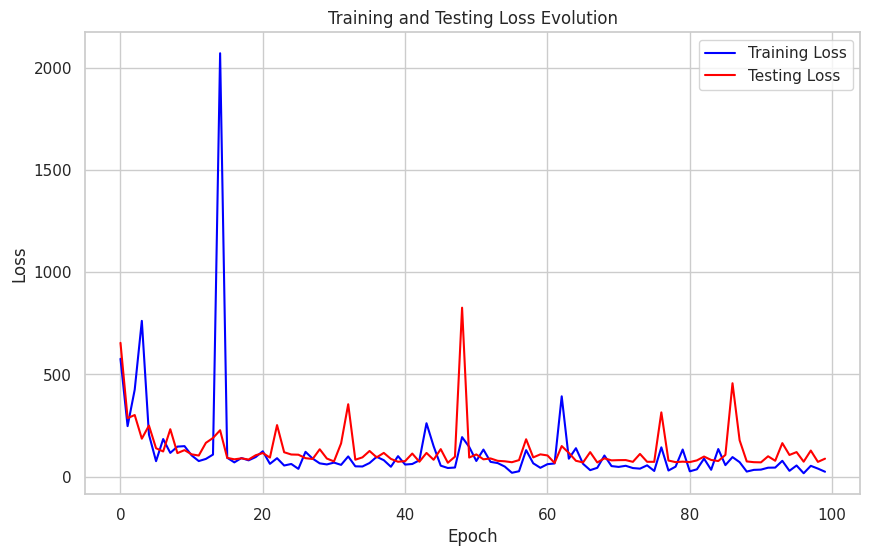

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(training_losses, label="Training Loss", color='blue')
plt.plot(testing_losses, label="Testing Loss", color='red')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Testing Loss Evolution")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
Y_predict_NN_train = nn_regressor.to("cpu")(torch. from_numpy(X_train).float()).detach().numpy()
Y_predict_NN_test = nn_regressor.to("cpu")(torch. from_numpy(X_test).float()).detach().numpy()

In [ ]:
resp = pd.read_csv("https://raw.githubusercontent.com/snwnkang/CS109A_Final/main/data/Milestone4_data/Response_data.csv")
OE = resp['OE']
OE_mean = OE.mean()
OE_std = OE.std()

OE_mean, OE_std

(221.07244256276874, 217.90481733194733)

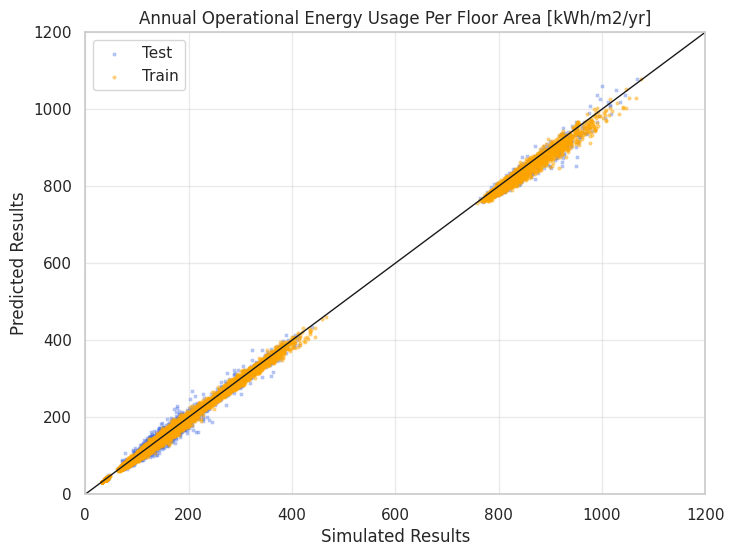

<Figure size 640x480 with 0 Axes>

In [ ]:
fig, ax = plt.subplots(figsize=(8,6));


xpoints_cs = ypoints_cs = ax.set_xlim(0,1200)


ax.scatter(Y_predict_NN_test, y_test, alpha=0.4, c='royalblue', label='Test', marker='x', s=4)
ax.scatter(Y_predict_NN_train, y_train, alpha=0.4, c='orange', label='Train', marker='o', s=4)
ax.plot(xpoints_cs, ypoints_cs, color='k', lw=1, scalex=False, scaley=False)

ax.set_ylim(0,1200)
ax.legend()



ax.grid(":", alpha=0.4);
ax.set_title('Annual Operational Energy Usage Per Floor Area [kWh/m2/yr]', fontsize=12);
ax.set_xlabel("Simulated Results", fontsize=12);
ax.set_ylabel("Predicted Results", fontsize=12);



plt.show()
plt.tight_layout();

In [ ]:
r2_nn = r2_score(y_test, Y_predict_NN_test)
mse_nn = mean_squared_error(y_test, Y_predict_NN_test)
rmse_nn = np.sqrt(mse_nn)

In [ ]:
model_comparison = add_model_results(
    model_comparison,
    'Neural Network',
    mse_nn,
    rmse_nn,
    r2_nn
)

In [ ]:
model_comparison

,Model,MSE,RMSE,R2
0,Polynomial Regression with Lasso,302.581275,17.394863,0.993755
1,Linear Regression,380.887786,19.516347,0.992138
2,Linear Regression with Preprocessing,380.883383,19.516234,0.992138
3,PCA Linear Regression,1009.804470,31.777421,0.979157
4,Decision Tree Regression,164.727118,12.834606,0.996600
5,Random Forest (Pre-tuning),80.288517,8.960386,0.998343
6,Random Forest (Post-tuning),80.574747,8.976344,0.998337
7,XGBoost (Pre-tuned),63.260267,7.953632,0.998694
8,XGBoost (Post-tuning),58.036042,7.618139,0.998802
9,Neural Network,88.516075,9.408298,0.998173


In [ ]:
comparison_df['Neural Network'] = Y_predict_NN_test
comparison_melted = comparison_df.melt('Actual', var_name='Model', value_name='Predicted')

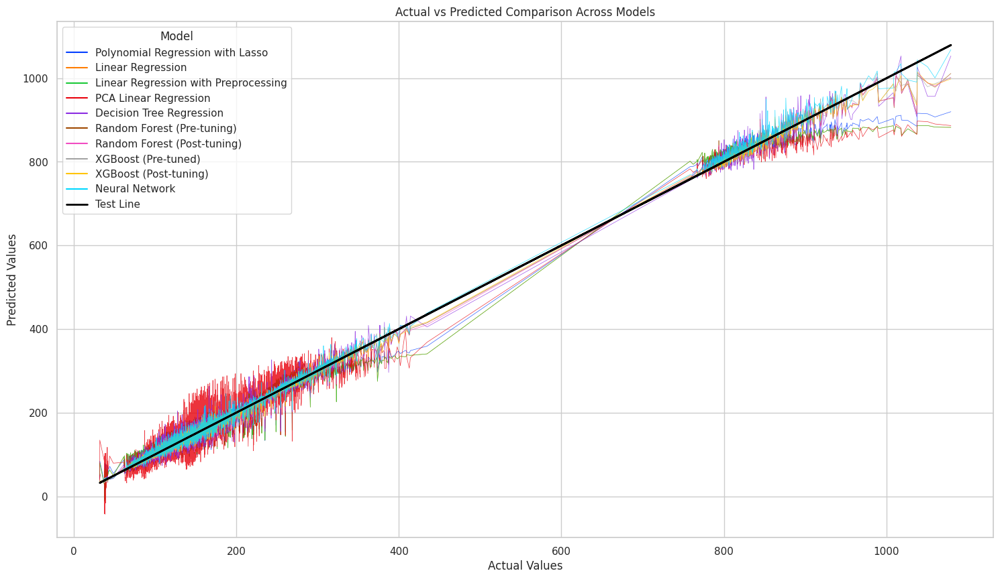

In [ ]:
plt.figure(figsize=(18, 10))
sns.lineplot(x='Actual', y='Predicted', hue='Model', data=comparison_melted, alpha=0.8, palette='bright', linewidth=0.5)
plt.plot(comparison_df['Actual'], comparison_df['Actual'], label='Test Line', color='black', lw=2, alpha=1)
plt.title('Actual vs Predicted Comparison Across Models')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend(title='Model')
plt.show()

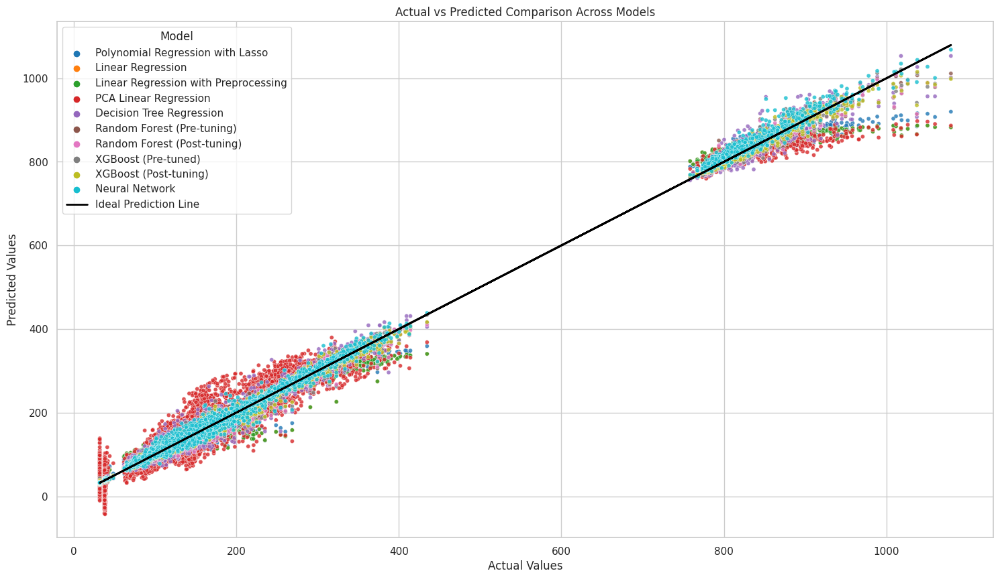

In [ ]:
plt.figure(figsize=(18, 10))
sns.scatterplot(x='Actual', y='Predicted', hue='Model', data=comparison_melted, alpha=0.8, palette='tab10', s=20)
plt.plot(comparison_df['Actual'], comparison_df['Actual'], label='Ideal Prediction Line', color='black', lw=2, alpha=1)
plt.title('Actual vs Predicted Comparison Across Models')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend(title='Model')
plt.show()

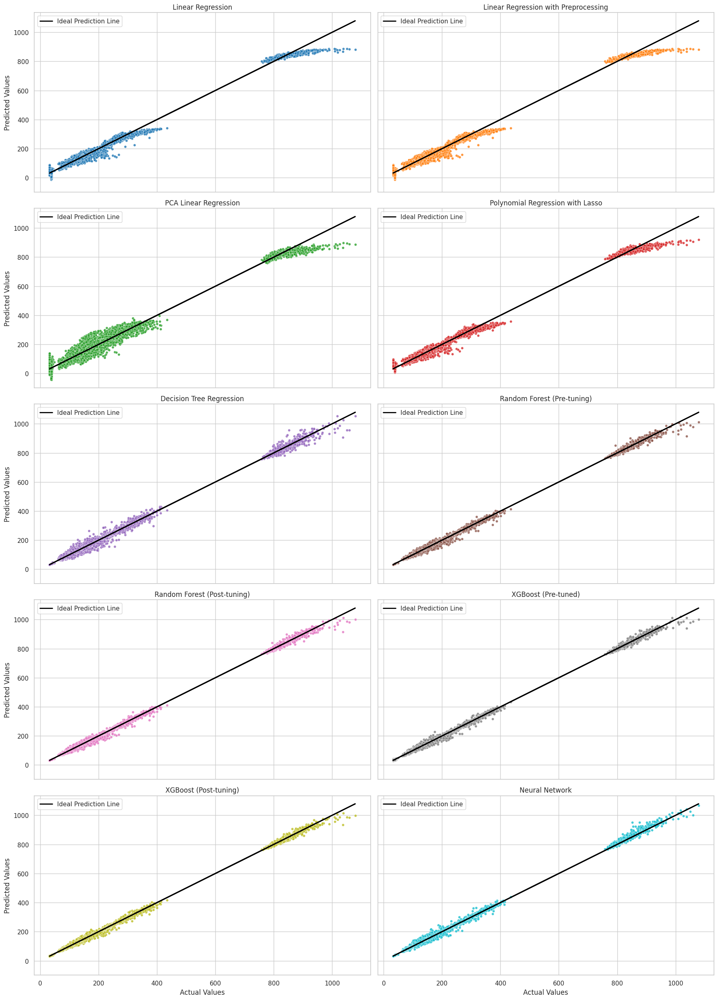

In [ ]:
model_order = [
    "Linear Regression", "Linear Regression with Preprocessing",
    "PCA Linear Regression", "Polynomial Regression with Lasso",
    "Decision Tree Regression", "Random Forest (Pre-tuning)",
    "Random Forest (Post-tuning)", "XGBoost (Pre-tuned)",
    "XGBoost (Post-tuning)", "Neural Network"
]

comparison_melted['Model'] = pd.Categorical(comparison_melted['Model'], categories=model_order, ordered=True)

comparison_melted_sorted = comparison_melted.sort_values('Model')
palette = sns.color_palette('tab10', len(model_order))
num_cols = 2
num_rows = len(model_order) // num_cols + (len(model_order) % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 5 * num_rows), sharex=True, sharey=True)
axes = axes.ravel()

for idx, model_name in enumerate(model_order):
    ax = axes[idx]
    model_group = comparison_melted_sorted[comparison_melted_sorted['Model'] == model_name]
    sns.scatterplot(x='Actual', y='Predicted', data=model_group, ax=ax, alpha=0.8, s=20, color=palette[idx])
    ax.plot(comparison_df['Actual'], comparison_df['Actual'], label='Ideal Prediction Line', color='black', lw=2, alpha=1)
    ax.set_title(model_name)
    ax.set_xlabel('Actual Values')
    ax.set_ylabel('Predicted Values')
    ax.legend()

for i in range(len(model_order), num_rows * num_cols):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()